<a href="https://www.kaggle.com/code/marcelocruzeta/we-will-find-brazilian-amazon-ratanaba?scriptVersionId=246961978" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# 1. Introduction

This notebook is part of the research project "OpenAi to Z Challenge", which aims to uncover archaeological sites in the Amazon rainforest, with a particular focus on the investigation of geoglyphs and evidence of human intervention.

To achieve this, we will utilize the Copernicus GLO-30 Digital Elevation Model (DEM) dataset, and Google Earth Engine (GEE) available in GeoTIFF format. Our analysis aims to visualize various aspects of the terrain to identify anomalies that may indicate human activity or historical geoglyphs.

Throughout this notebook, we will employ different visualization techniques, including hillshade, slope mapping, aspect analysis, and color relief mapping, to enhance our understanding of the spatial characteristics of the landscape. We will evaluate which visualization methods provide the clearest insights into the potential archaeological sites.

The following sections will outline our approach and methodology, including data loading, processing, and visualization, ultimately leading to a discussion of the observed results.

#### Dataset Citation:

NASA JPL (2021). <i>NASADEM Merged DEM Global 1 arc second V001</i>.  Distributed by OpenTopography. https://doi.org/10.5069/G93T9FD9. Accessed: 2025-06-06

European Space Agency (2024).  <i>Copernicus Global Digital Elevation Model</i>.  Distributed by OpenTopography.  https://doi.org/10.5069/G9028PQB. Accessed: 2025-06-11


## 1.A Updating Our Project to Meet the Next Checkpoints

We’ve been making great progress on our current project, successfully implementing image processing, filtering, and export functions using Google Earth Engine. Throughout this process, we’ve worked diligently to fine-tune our functions, ensuring they are robust and aligned with actual data (such as available bands like `'MSK_CLDPRB'` and `'SCL'`).  

Now, our next goal is to integrate these steps into a comprehensive workflow that fits the upcoming project checkpoints. Here's the plan:

### Next Steps in Our Workflow:

1. **Download Data for Each Site**  
   We will create a loop that processes each site—using their coordinates—and applies our existing filtering functions precisely as developed. This ensures each dataset is processed consistently and efficiently.

2. **Automate Image Processing and Export**  
   For each location, we will:
   - Set the region based on site coordinates.
   - Retrieve the Sentinel-2 collection.
   - Apply our custom filtering functions (masking clouds and shadows).
   - Generate median composite images.
   - Export the images for further analysis.

3. **Leverage the Data in AI Prompts**  
   Once images are ready, we plan to use an AI API **(like GPT-4.1 Vision)** to analyze these images' contents, generate descriptions, identify anomalies, and produce candidate footprints.

### Our Progress:

- **Function Development:**  
  We've successfully developed functions that perform visual filtering with correct band references, using available bands like `'MSK_CLDPRB'` and `'SCL'`.  
- **Data Integration:**  
  We are now prepared to process multiple sites using a combined loop that automates the entire pipeline.

### Moving Forward:

- Adjust the project workflow to run these functions iteratively for all sites.
- Ensure the images are exported correctly, and archives are ready for analysis.
- Incorporate AI prompts to interpret the visual data and generate actionable insights.
- Incorporate House Transform as a confirmation in Image Analysis.

**We're on the right path, and these refinements will make our process robust, scalable, and ready to meet the upcoming checkpoints.**  


## 1.B The Journey of Analyzing Anomalies in the Amazon Rainforest

## For de checkpoint 2 of Z challenge.
**We now comment commands and change file paths to avoid using the GEE and OpenDataTopography services repeatedly unnecessarily in the application testing phase.**

**If you want to see how to generate new files, take a look at version 25 of this Kaggle.**


## Introduction
In this saga, we explored the use of LIDAR image data and artificial intelligence techniques to uncover evidence of human intervention in the Amazon rainforest.

## Stages of the Journey

1. **Discovery of Human Interventions**:
   - We identified a location with clear human intervention that could be captured by freely available LIDAR images.

2. **References for Anomalies**:
   - From **The Archeo Blog**, we downloaded references to known anomalies that might be relevant to our analyses.

3. **Extraction of LIDAR Images**:
   - We obtained LIDAR images from the **OpenTopography** site, which provided the necessary basis for analysis.

4. **Preparing the Image for Prompt**:
   - We processed a special image to be used as a basis for generating prompts for OpenAI's **GPT-4.1 Vision**.

5. **Analysis of the Initial Image**:
   - We analyzed the image in the new **GPT-4.1 Vision**, which provided insights regarding the presence of features suggesting human intervention.

6. **Extraction of Satellite Images**:
   - Additionally, we extracted images from the **COPERNICUS/S2_SR_HARMONIZED** satellite using Google Earth Engine (GEE).
   - We adapted and implemented a script by **Justin Braaten - jdbcode**, which we use for cloud removal from the images.

7. **Re-Prompting for Analysis of the New Images**:
   - Using the prompt generated from the previous analysis, we conducted a re-prompt to analyze the processed images from item 6.

8. **Recording the Information**:
   - We saved information from all analyses into a JSON file. In the saved version number 25 of this Kaggle project, all analyzed images were satisfactory in identifying anomalies, which was expected due to the known presence of geoglyphs in the area.

9. **Next Steps**:
   - Our next step will be to utilize the developed system to analyze future image crops from yet unknown areas of the Amazon rainforest. The goal is to find new candidates that may require further field analysis.

## Conclusion
The interaction between geospatial data and artificial intelligence has allowed us to advance our search for human interventions in the Amazon rainforest, paving the way for future discoveries and analyses.

This notebook won one of the Early-sharing Prizes.
https://www.kaggle.com/competitions/openai-to-z-challenge/discussion/578996

published in this link: https://x.com/OpenAIDevs/status/1935371364602626466

# 2. Installation

This cell ensures that all required libraries are up-to-date and installs any necessary packages for the project. 

We will:
- Upgrade `pip` to the latest version.
- Install or upgrade the following libraries:
  - `rasterio` for reading and writing raster data (GeoTIFF).
  - `geopandas` for handling geospatial vector data (e.g., shapefiles).
  - `seaborn` for enhanced statistical data visualization.
  - Ensure compatibility by installing a specific version of `rich` required by the `bigframes` library.

Make sure to run this cell only once to set up the environment properly.

In [1]:
# ========================= CELL 1: Package Installations =========================

# Upgrade pip to ensure the latest package management features
!pip install --upgrade pip
# Installs or updates rasterio, a library for reading and writing raster data formats like GeoTIFF
!pip install --upgrade rasterio
# Installs or updates geopandas, a library for working with geospatial dataframes
!pip install --upgrade geopandas
# Installs or updates seaborn, a statistical data visualization library built on top of matplotlib
!pip install --upgrade seaborn
# Installs or updates the Earth Engine API for Python, used to access Google Earth Engine data and tools
!pip install earthengine-api --upgrade

# Optional: Add other installations if needed, e.g.,
# !pip install folium  # For interactive map visualization

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 34.1 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 107.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [rasterio]
  Attempting uninstall: geopandas
    Found existing installation: geopandas 0.14.4
    Uninstalling geopandas-0.14.4:
      Successfully uninstalled geopandas-0.14.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.42.0 requires rich<14,>=12.4.4, but you have rich 14.0.0 which is incompatible.
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.12.2
    Uninstalling seaborn-0.12.2:
      Successfully uninstalled seaborn-0.12.2
  Attempting uninstall: google-api-core
    Foun

# 3. Imports

In this cell, we will import the necessary libraries for our analysis and visualization.

The libraries included are:
- `numpy`: For numerical operations and array manipulations.
- `pandas`: For data manipulation and analysis.
- `rasterio`: For reading and writing raster data (GeoTIFF files).
- `matplotlib.pyplot`: For plotting and visualizing data.
- `geopandas`: For working with geospatial vector data (e.g., shapefiles).
- `seaborn`: For enhanced statistical data visualization.
- `PIL (Pillow)`: For image processing tasks, if needed.
- `os`: For file and directory management tasks.
- `openai`: To interact with OpenAI API (if required).
- `kaggle_secrets`: To securely access secrets (like API keys) in the Kaggle environment.


In [2]:
# ========================= CELL 2: Imports and Initial Configurations =========================

# Standard library imports
import os  # To perform operating system dependent functionalities, like file management
import json  # Standard library for working with JSON (JavaScript Object Notation) data.
import ee  # Earth Engine API for accessing and manipulating satellite and terrestrial data.
import base64  # Standard library for encoding and decoding data in Base64 format.
import geemap.core as geemap  # Library to facilitate the use of Google Earth Engine with interactive maps and visualizations.
import requests  # Library for making HTTP requests easily and quickly.
import gdown  # Library to download files from Google Drive directly using the file ID.
import math  # Standard library for mathematical functions, such as trigonometry and basic operations.
import cv2  # OpenCV library to facilitate computer vision tasks, including image processing, object detection, and video analysis.
import numpy as np  # For numerical computations and array manipulations, essential for data processing
import pandas as pd  # For structured data handling, dataframes, and data analysis
import rasterio  # To read, write, and process GeoTIFF raster data
from rasterio.transform import Affine
from rasterio.transform import xy
import matplotlib  # Library for creating static, animated, and interactive visualizations in Python.
import pprint  # Standard library for "pretty-printing" data structures to make them more readable.
import matplotlib.pyplot as plt  # To create static, animated, and interactive visualizations
import matplotlib.colors as colors  # Submodule of Matplotlib for handling colors.
import matplotlib.patches as patches  # Submodule of Matplotlib for creating shapes (patches) in plots.
from IPython.display import display, HTML  # Functions to display HTML elements within Jupyter notebooks.
from io import BytesIO  # In-memory binary streams for input and output data manipulation.
import geopandas as gpd  # Extends pandas for spatial data reading, writing, and analysis
import seaborn as sns  # For statistical data visualization, built on top of matplotlib
from PIL import Image  # Provides image processing capabilities (loading, manipulating images)
from openai import OpenAI  # To interact with the OpenAI API for language model queries
from kaggle_secrets import UserSecretsClient  # To securely access API keys stored in Kaggle Secrets
from scipy.ndimage import gaussian_filter  # For image filtering and smoothing operations
import folium  # To create interactive maps for visualization of spatial data
from folium import Rectangle  # Class from Folium for creating rectangles on interactive maps.
from tabulate import tabulate  # Library for formatting tables in a readable way in text.
# Optional: set Seaborn style for aesthetic plots
sns.set(style="whitegrid")

# 4. Define Functions

In this cell, we will define various functions that will be utilized throughout the analysis and visualization of the geospatial data.

The main functions to be implemented include:

1. **load_raster**: A function to load GeoTIFF raster files and return the corresponding data for analysis.

2. **visualize_raster**: A function to generate different types of visualizations from raster data, such as hillshade and relief maps, allowing customization through parameters.

3. **analyze_anomalies**: A function designed to identify anomalies in the raster data based on specified criteria, helping to highlight potential archaeological features.

4. **process_image**: A function for performing specific image processing tasks, which may include filters or modifications necessary for further analysis.

5. **export_results**: A function to save the processed results to specified file formats, ensuring results can be easily shared or analyzed further.

6. **descriptive_statistics**: A function to calculate and return descriptive statistics of the data, providing insights into the characteristics of the analyzed terrain.

Defining these functions will enhance the organization of the code and allow for easier reuse of functionality across the notebook.

In [3]:
def load_raster(file_path):

    """
    Load a GeoTIFF raster file and return the data.
    
    Parameters:
    file_path (str): The path to the GeoTIFF file.

    Returns:
    geoTiff_data: The raster data read from the file.
    profile: The metadata profile of the raster.
    """
    try:
        with rasterio.open(file_path) as src:
            geoTiff_data = src.read()  # Read the raster data
            profile = src.profile  # Get the metadata profile
        return geoTiff_data, profile  # Return the loaded data and profile
    except FileNotFoundError:
        print(f"Error: The file at {file_path} was not found.")
        return None, None  # Return None on error
    except rasterio.errors.RasterioError as e:
        print(f"Rasterio error occurred: {e}")
        return None, None  # Return None on error
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        
        return None, None  # Return None on error

def descriptive_statistics(geoTiff_data, profile):
    """
    Calculate and return descriptive statistics of the raster data.
    
    Parameters:
    geoTiff_data: The raster geoTiff_data (3D numpy array).
    profile: The metadata profile of the raster (for geotransform and dimensions).
    
    Returns:
    results: A dictionary containing descriptive statistics including area covered,
             minimum and maximum altitudes, valid data ratio, mean and standard deviation.
    """
    results = {}
    
    # 1. Dimensions
    results['width'] = profile['width']  # Width of the raster in pixels
    results['height'] = profile['height']  # Height of the raster in pixels
    
    # 2. Area Covered - Calculate the total area in square meters
    geotransform = profile['transform']  # Transformation array providing scaling info
    pixel_area = abs(geotransform[0] * geotransform[4])  # Area of a single pixel in square meters
    area_covered = results['width'] * results['height'] * pixel_area  # Total area in square meters
    results['area_covered'] = area_covered  # Store the total area
    
    # 3. Minimum and Maximum Altitudes
    data_2d = geoTiff_data[0]  # Assuming the data is in the first band
    results['altitude_min'] = np.nanmin(data_2d)  # Minimum altitude value, ignoring NaNs
    results['altitude_max'] = np.nanmax(data_2d)  # Maximum altitude value, ignoring NaNs
    
    # 4. Valid Data Statistics
    valid_data_count = np.count_nonzero(~np.isnan(data_2d))  # Count valid (non-null) entries
    total_data_count = data_2d.size  # Total number of pixels in the raster
    results['valid_data_ratio'] = valid_data_count / total_data_count  # Ratio of valid data to total pixels
    
    # 5. Mean and Standard Deviation
    results['mean_altitude'] = np.nanmean(data_2d)  # Mean altitude value, ignoring NaNs
    results['std_dev_altitude'] = np.nanstd(data_2d)  # Standard deviation of altitude values, ignoring NaNs

    return results

def generate_dtm_from_elevation(elevation_data, output_path):
    """
    Save the elevation data as a DTM in a GeoTIFF file.
    
    Parameters:
    elevation_data: The 2D array of elevation data.
    output_path: The path where the DTM will be saved.
    """
    try:
        # Get information to create the GeoTIFF
        with rasterio.open(file_path_0) as src:
            profile = src.profile  # Get the profile of data
            profile.update({
                'count': 1,  # Only one band
                'dtype': elevation_data.dtype  # Data type
            })
        
        # Save as GeoTIFF
        with rasterio.open(output_path, 'w', **profile) as dst:
            dst.write(elevation_data, 1)  # Write the first band
        print(f"DTM saved at {output_path}")
    
    except Exception as e:
        print(f"An error occurred while generating the DTM: {e}")

def visualize_raster(file_path):
    """
    Visualize a raster image from a GeoTIFF file.

    Parameters:
    file_path (str): The path to the GeoTIFF file containing elevation data.
    """
    try:
        with rasterio.open(file_path) as src:
            data = src.read(1)  # Read the first band
            plt.figure(figsize=(10, 8))  # Set the figure size
            plt.imshow(data, cmap='terrain')  # Use terrain colormap for better visualization
            plt.colorbar(label='Elevation (m)')  # Add a colorbar to indicate elevation scale
            plt.title('Digital Terrain Model (DTM)')  # Set the title of the plot
            plt.xlabel('Columns (pixels)')  # X-axis label
            plt.ylabel('Rows (pixels)')  # Y-axis label
            plt.show()  # Show the plot
    except Exception as e:
        print(f"An error occurred while visualizing the raster: {e}")

def visualize_raster_dtm(file_path):
    """
    Visualize a raster image from a GeoTIFF file.

    Parameters:
    file_path (str): The path to the GeoTIFF file containing elevation data.
    """
    try:
        with rasterio.open(file_path) as src:
            data = src.read(1)  # Read the first band
            plt.figure(figsize=(10, 8))  # Set the figure size
            plt.imshow(data, cmap='terrain')  # Use terrain colormap for better visualization
            plt.colorbar(label='Elevation (m)')  # Add a colorbar to indicate elevation scale
            plt.title('Digital Terrain Model (DTM)')  # Set the title of the plot
            plt.xlabel('Columns (pixels)')  # X-axis label
            plt.ylabel('Rows (pixels)')  # Y-axis label
            plt.show()  # Show the plot
    except Exception as e:
        print(f"An error occurred while visualizing the raster: {e}")

def calculate_slope(dtm_data):
    """
    Calculate the slope of the Digital Terrain Model (DTM) using gradients.

    Parameters:
    dtm_data (numpy array): The 2D array of elevation data from the DTM.

    Returns:
    numpy array: A 2D array representing the slope in degrees.
    """
    # Smooth the DTM data to reduce noise
    dtm_filtered = gaussian_filter(dtm_data, sigma=1)  # Apply Gaussian filter for smoothing

    # Calculate gradients (slope)
    dx, dy = np.gradient(dtm_filtered)  # Compute gradients in the x and y directions
    slope = np.arctan(np.sqrt(dx**2 + dy**2))  # Calculate slope in radians
    slope_degrees = np.degrees(slope)  # Convert radians to degrees
    return slope_degrees  # Return the slope in degrees

def crop_circular_region(image, center, radius):
    """
    Crops a circular region from the given image.

    Parameters:
    - image: 2D or 3D array of the original image
    - center: tuple (x_center, y_center) of the circle's center
    - radius: radius of the circular crop

    Returns:
    - the cropped region with the mask applied
    """
    # Get the dimensions of the image
    rows, cols = image.shape[:2]
    y_indices, x_indices = np.ogrid[:rows, :cols]
    
    # Calculate the distance of each pixel from the center
    dist = np.sqrt((x_indices - center[0])**2 + (y_indices - center[1])**2)
    
    # Create the circular mask
    mask = dist <= radius
    
    # Apply the mask to the image
    if image.ndim == 3:
        # For color images with channels
        mask = mask[:, :, np.newaxis]
        cropped_region = np.where(mask, image, np.nan)  # Replace outside with NaN
    else:
        cropped_region = np.where(mask, image, np.nan)
        
    return cropped_region

def save_region(region_array, filename):
    """
    Save the already cropped region to an image file.
    """
    plt.imsave(filename, region_array, cmap='terrain')  # Use colormap padrão que usou

def selecionar_registros(csv_path, col, col_list, show_table=False):
    """
    Loads records from a CSV, filters by col list and displays the table.
    
    Parameters:
    - csv_path (str): Path of the CSV file.
    - col: column name
    - col_list (list): List of col_list names to filter.
    - show_table (bool): If True, displays the filtered table.
    
    Returns:
    - filtered_df (pd.DataFrame): DataFrame with the filtered records.
    """
    # Leitura do CSV
    df = pd.read_csv(csv_path)

    # Filtra por KLM
    filtered_df = df[df[col].isin(col_list)].copy()

        # Opcional: mostra a tabela
    if show_table:
        headers = ["KLM", "Site Name", "Latitude", "Longitude"]
        print("List of selected records:")
        print(tabulate(
            filtered_df,
            headers=headers,
            tablefmt='fancy_grid',
            numalign='center',
            stralign='center',
            showindex=False
        ))

    # Retorna o dataframe filtrado
    return filtered_df

def get_s2_sr_cld_col(aoi, start_date, end_date):
    # Coleção harmonizada do Sentinel-2
    s2_sr_col = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterBounds(aoi)
        .filterDate(start_date, end_date)
        .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_FILTER)))
    # Coleção de probabilidade de nuvem
    s2_cloudless_col = (ee.ImageCollection('COPERNICUS/S2_CLOUD_PROBABILITY')
        .filterBounds(aoi)
        .filterDate(start_date, end_date))
    # Join para associar a probabilidade de nuvem
    return ee.ImageCollection(ee.Join.saveFirst('s2cloudless').apply(**{
        'primary': s2_sr_col,
        'secondary': s2_cloudless_col,
        'condition': ee.Filter.equals(**{
            'leftField': 'system:index',
            'rightField': 'system:index'
        })
    }))
    
def add_cld_mask(img):
    # Obter a banda de probabilidade de nuvem
    cloud_prob = ee.Image(img.get('s2cloudless')).select('probability')
    # Mask de nuvens com limiar
    clouds = cloud_prob.gt(CLD_PRB_THRESH).rename('clouds')
    return img.addBands(clouds)

def add_shadows_mask(img):
    # Bits de classificação na banda 'SCL' indicam sombras, água, etc.
    scl = img.select('SCL')
    not_water = scl.neq(6)
    # Pixels escuros na banda B8 (NIR) como indicativo de sombras
    SR_BAND_SCALE = 1e4
    dark_pixels = img.select('B8').lt(NIR_DRK_THRESH * SR_BAND_SCALE).multiply(not_water).rename('dark_pixels')
    # Direção de projeção de sombras (ajuste para sua região ou solar)
    shadow_azimuth = ee.Number(90).subtract(ee.Number(img.get('MEAN_SOLAR_AZIMUTH_ANGLE')))
    # Projetar sombras de nuvens
    cld_proj = (img.select('clouds')
        .directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST * 10)
        .reproject(**{'crs': img.select(0).projection(), 'scale': 20})
        .select('distance')
        .mask()
        .rename('cloud_transform'))
    # Pessoas que são pixels escuros intersectando projeções de sombra
    shadows = cld_proj.multiply(dark_pixels).rename('shadows')
    return img.addBands(ee.Image([dark_pixels, cld_proj, shadows]))

# Para visualizar na interface interativa
def add_ee_layer(self, ee_image, vis_params, name):
    map_id_dict = ee_image.getMapId(vis_params)
    tiles_url = map_id_dict['tile_fetcher'].url_format
    folium.TileLayer(
        tiles=tiles_url,
        attr='Map Data &copy; Google Earth Engine',
        name=name,
        overlay=True,
        control=True
    ).add_to(self)

def add_cld_shdw_mask(img):
    # Bands adicionais de nuvem e sombra
    img_cloud = add_cld_mask(img)
    img_cloud_shadow = add_shadows_mask(img_cloud)
    # Combinar máscaras de nuvem e sombra (1= nuvem/shadow, 0=no)
    is_cld_shdw = img_cloud_shadow.select('clouds').add(img_cloud_shadow.select('shadows')).gt(0)
    # Refinar máscara com focalMin e focalMax para eliminar pequenas áreas
    is_cld_shdw = (is_cld_shdw.focalMin(2).focalMax(BUFFER / 20)
        .reproject(**{'crs': img.select(0).projection(), 'scale': 20})
        .rename('cloudmask'))
    return img_cloud_shadow.addBands(is_cld_shdw)

# Function to download a topography tile
def download_topo_tile(lat_center, lon_center, area_km2=10, save_dir='/kaggle/working/', filename='tile.tif'):
    delta_deg = calculate_delta_deg(area_km2)
    south = lat_center - delta_deg / 2
    north = lat_center + delta_deg / 2
    west = lon_center - delta_deg / 2
    east = lon_center + delta_deg / 2

    url = (
        'https://portal.opentopography.org/API/globaldem'
        f'?demtype=SRTMGL3'
        f'&south={south}'
        f'&north={north}'
        f'&west={west}'
        f'&east={east}'
        f'&outputFormat=GTiff'
        f'&API_Key={API_Key}'
    )

    response = requests.get(url)
    if response.status_code == 200:
        full_path = os.path.join(save_dir, filename)
        with open(full_path, 'wb') as f:
            f.write(response.content)
        print(f'{filename} saved.')
    else:
        print(f"Error downloading {filename}: {response.status_code}")

# Function to encode an image to Base64
def encode_image(image_path):
    """
    Encodes an image to a Base64 string.
    Parameters:
    - image_path (str): Path to the image file to encode.
    Returns:
    - str: Base64 encoded string of the image.
    """
    try:
        with open(image_path, "rb") as image_file:
            return base64.b64encode(image_file.read()).decode("utf-8")
    except Exception as e:
        print(f"Error encoding image '{image_path}': {e}")
        return None
        
# Step 1: Select TIFFs from a directory
def get_tiff_files(directory):
    """Retrieve a list of TIFF files from the given directory."""
    return [os.path.join(directory, f) for f in os.listdir(directory) if f.lower().endswith('.tif')]

# Step 2: Analyze TIFF and log basic data
def analyze_tiff(tiff_path):
    """Extract geographic information from the TIFF file."""
    with rasterio.open(tiff_path) as src:
        bounds = src.bounds
        altitude = src.read(1).mean()  # Average altitude from the first band
        lat = (bounds.top + bounds.bottom) / 2
        lon = (bounds.left + bounds.right) / 2
    return {
        'file_name': os.path.basename(tiff_path),
        'latitude': lat,
        'longitude': lon,
        'altitude': altitude,
    }
    
# Step 3: Convert TIFF to PNG
def convert_tif_to_png(tif_path, png_path):
    """Convert a TIFF file to PNG format."""
    with rasterio.open(tif_path) as src:
        data = src.read(1)  # Read the first band
        data = (data - data.min()) / (data.max() - data.min()) * 255  # Normalize
        data = data.astype('uint8')
        with rasterio.open(
            png_path,
            'w',
            driver='PNG',
            height=data.shape[0],
            width=data.shape[1],
            count=1,
            dtype='uint8'
        ) as dst:
            dst.write(data, 1)

def analyze_image(client, image_path):
    """Send the PNG image to OpenAI for analysis."""
    base64_image = encode_image(image_path)
    prompt = (
        "You are being shown a COPERNICUS/S2_SR_HARMONIZED satelite image, "
        "look for distinct linear and curving ridges and depressions, "
        "straight and intersecting raised lines or embankments,"
        "possibly indicating man-made structures such as ancient roads,"
        "agricultural terraces, or boundaries,"
        "elongated depressions running roughly parallel to these ridges,"
        "creating a geometric or grid-like pattern"
        "Small mounds and subtle rises in the terrain visible between linear features"
        "If you find some of these characteristics in the analyzed image,"
        "write the word FOUND in capital letters in the first position of your description"
        "Do not use the word FOUND in your description if you do not find any of the anomalies described above"
        "Return the coordinates of your findings in a simple format like: [{x1, y1}, {x2, y2}, ...], where x and y are pixel values."
        "Describe surface features in plain English."
    )
    # Chamada à API da OpenAI
    response = client.responses.create(
        model="gpt-4.1",
        input=[
            {
                "role": "user",
                "content": [
                    {
                        "type": "input_text",
                        "text": prompt
                    },
                    {
                        "type": "input_image",
                        "image_url": f"data:image/png;base64,{base64_image}",
                    },
                ],
            }
        ]
    )
    # Acesso ao texto resultante a partir da estrutura fornecida
    output_text = response.output[0].content[0].text  # Ajustando para acessar o texto gerado
    model_version = response.model  # Acessa a versão do modelo
    print(f"Analise completed for: {image_path}")
    return {
        'output_text': output_text,
        'model_version': model_version,
        'dataset_id': 'marcelocruzeta/z-challenge-files'  # Substituir pelo ID real
    }

def analyze_single_png(prompt, png_file):
    """Analyzes a PNG image and generates a description using OpenAI's API.

    Args:
        prompt (str): The prompt to instruct the AI on how to describe the image.
        png_file (str): The path to the PNG image file to be analyzed.

    Returns:
        dict: A dictionary containing the dataset ID, model version, and generated output text.
    """
    # Retrieve user secrets for OpenAI API
    user_secrets = UserSecretsClient()
    openaikey = user_secrets.get_secret("Z_Challenge_Key")

    # Initialize OpenAI client
    client = OpenAI(api_key=openaikey)

    # Get the Base64 string of the image
    base64_image = encode_image(png_file)

    # Create a response using the OpenAI client
    response = client.responses.create(
        model="gpt-4.1",
        input=[
            {
                "role": "user",
                "content": [
                    {
                        "type": "input_text",
                        "text": prompt
                    },
                    {
                        "type": "input_image",
                        "image_url": f"data:image/jpeg;base64,{base64_image}",
                    },
                ],
            }
        ],
    )

    # Define the dataset ID
    dataset_id = 'marcelocruzeta/z-challenge-files'  # Replace with your actual dataset ID

    # Prepare result summary
    result_summary = {
        "Dataset ID": dataset_id,
        "Model Version": response.model,
        "Generated Output Text": response.output_text
    }

    return result_summary

# Step 5: Save logs to JSON
def save_logs_to_json(logs, output_file):
    """Save the logs of analysis and metadata to a JSON file."""
    with open(output_file, 'w') as f:
        json.dump(logs, f, indent=4)

# Main processing function
def process_images(input_directory, output_directory, log_file):
    """Process all TIFF files in the input directory, converting them to PNG and analyzing them."""
    tiff_files = get_tiff_files(input_directory)
    logs = []
    # Instantiate the OpenAI client
    api_key = load_secret('Z_Challenge_Key')  # Load your API key
    client = OpenAI(api_key=api_key)
    for tif_file in tiff_files:
        # Analyze TIFF
        metadata = analyze_tiff(tif_file)
        
        # Convert to PNG
        png_file = os.path.join(output_directory, f"{os.path.splitext(os.path.basename(tif_file))[0]}.png")
        convert_tif_to_png(tif_file, png_file)
        
        # Analyze PNG
        analysis_result = analyze_image(client, png_file)
        
        # Combine logs
        log_entry = {
            'metadata': metadata,
            'analysis': analysis_result
        }
        logs.append(log_entry)
    # Save all logs to JSON
    save_logs_to_json(logs, log_file)

def process_range_images(csv_path, start_tile, end_tile, save_dir, output_dir, log_file):
    # Step 1: Download the images from OpenTopography
    download_range_from_csv(csv_path, start_tile, end_tile, save_dir)
    
    # Step 2: Ensure the output directory exists
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Created output directory: {output_dir}")
    
    # Step 3: Process the downloaded images
    process_images(input_directory=save_dir, output_directory=output_dir, log_file=log_file)

# Function to retrieve and download tiles based on list of names
def download_multiple_tiles(klm_list, df, area_km2=10, save_dir='/kaggle/working/SRTMGL3/'):
    for klm_name in klm_list:
        record = df[df['KLM'] == klm_name]
        if record.empty:
            print(f"Record not found for KLM: {klm_name}")
            continue
        lat = float(record.iloc[0]['lat'])
        lon = float(record.iloc[0]['lon'])
        filename = klm_name + ".tif"
        download_topo_tile(lat, lon, area_km2, save_dir, filename)
        print(f"Download completed for: {klm_name}")

def filter_tiles_by_range(csv_path, start_tile, end_tile):
    # Read the CSV file
    df = pd.read_csv(csv_path)
    
    # Filter the data to include only rows whose tiles are within the specified range
    filtered_df = df[(df['Tile'] >= start_tile) & (df['Tile'] <= end_tile)]
    
    # Print the selected data
    print("Selected data:")
    print(filtered_df)

    return filtered_df

def download_topo_tile_coord(lat_nw, lon_nw, lat_se, lon_se, save_dir, filename):
    url = (
        'https://portal.opentopography.org/API/globaldem'
        f'?demtype=SRTMGL3'
        f'&south={lat_se}'    # Latitude mais ao sul
        f'&north={lat_nw}'    # Latitude mais ao norte
        f'&west={lon_nw}'     # Longitude mais ao oeste
        f'&east={lon_se}'     # Longitude mais ao leste
        f'&outputFormat=GTiff'
        f'&API_Key={API_Key}' # Substitua por sua chave de API
    )
    
    response = requests.get(url)
    if response.status_code == 200:
        full_path = os.path.join(save_dir, filename)
        with open(full_path, 'wb') as f:
            f.write(response.content)
        print(f'{filename} saved.')
    else:
        print(f"Error downloading {filename}: {response.status_code}")

def download_tiles_from_csv(csv_path, tile, save_dir):
    # Read the CSV
    df = pd.read_csv(csv_path)

    # Filter the DataFrame to only include rows with the specified tile numbers
    filtered_df = df[df['Tile'].isin(tile_numbers)]

    for index, row in filtered_df.iterrows():
        # Extract coordinates for the corners
        nw_lat = row['NW_Latitude']
        nw_lon = row['NW_Longitude']
        se_lat = row['SE_Latitude']
        se_lon = row['SE_Longitude']

        # Create a filename based on the tile number
        tile_number = row['Tile']
        filename = f"tile_{tile_number}.tif"

        # Download the tile using the corner coordinates
        download_topo_tile_coord(nw_lat, nw_lon, se_lat, se_lon, save_dir=save_dir, filename=filename)

def download_range_from_csv(csv_path, start_tile, end_tile, save_dir):
    # Create the save directory if it doesn't exist
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
        print(f"Created directory: {save_dir}")

    # Get the filtered tiles within the specified range
    filtered_df = filter_tiles_by_range(csv_path, start_tile, end_tile)

    # Loop over the filtered DataFrame and download each tile
    for index, row in filtered_df.iterrows():
        # Extract the coordinates for the corners
        nw_lat = row['NW_Latitude']
        nw_lon = row['NW_Longitude']
        se_lat = row['SE_Latitude']
        se_lon = row['SE_Longitude']
        
        # Create a filename based on the tile number
        tile_number = row['Tile']
        filename = f"tile_{tile_number}.tif"
        
        # Download the tile using the corner coordinates
        download_topo_tile_coord(nw_lat, nw_lon, se_lat, se_lon, save_dir=save_dir, filename=filename)
        print(f"Download completed for: {filename}")

def format_value(val):
    if isinstance(val, float):
        return f"{val:.4f}"
    elif isinstance(val, tuple):
        return "(" + ", ".join(f"{v:.4f}" for v in val) + ")"
    else:
        return val

# Aqui uma função que faz toda a rotina para um registro
def processar_registro(lon, lat, nome, buffer_km=2):
    # Define a região de interesse
    aoi = ee.Geometry.Point(lon, lat)
    region = aoi.buffer(buffer_km*1000).getInfo()['coordinates']
    
    # Busca coleção
    col = get_s2_sr_cld_col(aoi, START_DATE, END_DATE)
    # Aplica as máscaras
    col_masked = col.map(add_cld_shdw_mask)
    # Gera a mediana
    median_img = col_masked.median()
    # Visualização (não obrigatório na rotina, mas se desejar pode exibir)
    # imagem_visualizada = median_img.visualize(**{'bands': ['B4', 'B3', 'B2'], 'min':0, 'max':3000, 'gamma':1.1})

    # Exporta usando sua lógica
    imagem_visualizada = median_img.visualize(**{'bands': ['B4', 'B3', 'B2'], 'min':0, 'max':3000, 'gamma':1.1})

    # Configura a tarefa
    task = ee.batch.Export.image.toDrive(
        image=imagem_visualizada,
        description='Export_'+nome,
        folder='GEEE',
        fileNamePrefix=nome,
        region=region,
        scale=10,
        maxPixels=1e10
    )
    # Inicia a exportação
    task.start()
    print(f'Exportando {nome}...')

def load_secret(secret_label):
    """Load secret from Kaggle."""
    try:
        return UserSecretsClient().get_secret(secret_label)
    except Exception as e:
        print("Error loading secret from Kaggle:", e)
        return None
        
# Function to convert image to base64
def pil_to_base64(img):
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    return f"data:image/png;base64,{img_str}"

# Function to display the table
def display_analysis(directory, json_file):
    # Lendo o arquivo JSON
    with open(os.path.join(directory, json_file)) as f:
        json_data = json.load(f)

    if isinstance(json_data, dict):
        tiles = json_data.get('tiles', [])
    elif isinstance(json_data, list):
        tiles = json_data
    else:
        tiles = []

    if tiles:
        data = []
        for tile in tiles:
            if isinstance(tile, dict) and 'metadata' in tile:
                tile_png = os.path.join(directory, tile['metadata']['file_name'].replace('.tif', '.png'))
                tile_tif = os.path.join(directory, tile['metadata']['file_name'])
                # Verificação da existência dos arquivos
                if os.path.exists(tile_png) and os.path.exists(tile_tif):
                    data.append({
                        'PNG': tile_png,
                        'TIFF': tile_tif,
                        'analysis': tile.get('analysis', {}),
                        'metadata': tile.get('metadata', {})
                    })

        # Iterando sobre cada um dos tiles para exibir
        for tile_data in data:
            png_img = Image.open(tile_data['PNG'])
            with rasterio.open(tile_data['TIFF']) as src:
                tif_img = src.read(1)  # Ler a primeira banda do TIFF
                plt.imshow(tif_img, cmap='terrain')  # Usar o colormap 'terrain'
                plt.axis('off')
                # Salvar a figura em um buffer para visualização como PNG
                plt.savefig('tif_image.png', bbox_inches='tight', pad_inches=0)
                plt.close()
            
            png_base64 = pil_to_base64(png_img)
            with open('tif_image.png', 'rb') as f:
                tif_base64 = base64.b64encode(f.read()).decode()

            # Extraindo dados da metadata
            metadata = tile_data['metadata']
            file_name = os.path.basename(tile_data['PNG'])
            tif_file_name = os.path.basename(tile_data['TIFF'])

            # Conteúdo HTML, incluindo as novas informações
            html_content = f"""
            <table style="min-width: 50px">
                <colgroup>
                    <col style="min-width: 250px;">  <!-- Ajustado para tamanho da coluna da imagem -->
                    <col style="min-width: 150px;">  <!-- Manter a coluna de análise menor -->
                </colgroup>
                <tbody>
                    <tr>
                        <td colspan="1" rowspan="1" style="text-align: left;">
                            <strong>Imagem: {file_name}</strong><br>
                            <img src="{png_base64}" width="150" height="auto">  <!-- Aumento da largura da imagem -->
                        </td>
                        <td colspan="1" rowspan="2" style="text-align: left; padding-left: 20px;">
                            <strong>JSON Análise</strong><br>
                            {tile_data['analysis'].get('output_text', "No analysis available")}<br><br>
                            
                            <strong>File Name:</strong> {metadata['file_name']}<br>
                            <strong>Latitude:</strong> {metadata['latitude']}<br>
                            <strong>Longitude:</strong> {metadata['longitude']}<br>
                            <strong>Altitude:</strong> {metadata['altitude']}<br>
                            <strong>Model Version:</strong> {tile_data['analysis'].get('model_version', "N/A")}
                        </td>
                    </tr>
                    <tr>
                        <td colspan="1" rowspan="1" style="text-align: left;">
                            <strong>Tile: {tif_file_name}</strong><br>
                            <img src="data:image/png;base64,{tif_base64}" width="150" height="auto">  <!-- Aumento da largura da imagem -->
                        </td>
                    </tr>
                </tbody>
            </table>
            """
            display(HTML(html_content))
    else:
        print("Nenhum tile encontrado no JSON.")

def hough_transform_apply(file_path, x_start, y_start, width, height, low_threshold=50, high_threshold=200, hough_threshold=30):
    """
    Detects lines in a geotiff image using Hough Transform.
    
    Parameters:
        file_path (str): The path to the input image file (GeoTIFF or PNG).
        x_start (int): The starting x-coordinate for the region of interest.
        y_start (int): The starting y-coordinate for the region of interest.
        width (int): The width of the region of interest.
        height (int): The height of the region of interest.
        low_threshold (int): Lower threshold for Canny edge detection.
        high_threshold (int): Upper threshold for Canny edge detection.
        hough_threshold (int): Threshold for Hough Transform line detection.
    
    Returns:
        output_image (numpy.ndarray): Image with detected lines drawn.
    """
    
    # Load the GeoTIFF image
    with rasterio.open(file_path) as src:
        image = src.read(1)

    # Normalize the image
    image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    # Select the Region of Interest (ROI)
    roi = image[y_start:y_start + height, x_start:x_start + width]

    # Apply Gaussian Blur to the ROI
    roi_blurred = cv2.GaussianBlur(roi, (5, 5), 0)

    # Canny Edge Detection on the ROI
    edges = cv2.Canny(roi_blurred, low_threshold, high_threshold)

    # Apply Hough Transform to the Edges
    lines = cv2.HoughLines(edges, 1, np.pi / 180, hough_threshold)

    # Create an output image to draw the lines
    output_image = np.zeros_like(roi)

    # Draw the lines on the output image if any are detected
    if lines is not None:
        for rho, theta in lines[:, 0]:
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            cv2.line(output_image, (x1, y1), (x2, y2), (255, 255, 255), 1)

    # Visualize the results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Edges')
    plt.imshow(edges, cmap='gray')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.title('Detected Lines')
    plt.imshow(output_image, cmap='gray')
    plt.axis('off')
    
    plt.show()

    return output_image

# 5. Selecting data from a database extracted from The Archeo Blog website.
**The Archeo Blog is a website where you can find records about anomalies and geoglyphs.**
https://www.jqjacobs.net/blog/</br>
**Let's extract 5 points where we know there are references to ancient human intervention**

### Loads records from a CSV, filters by a list of KLM, and displays the table.

### Parameters:
- **csv_path** (str): Path to the CSV file.
- **klm_list** (list): List of KLM names to filter.
- **show_table** (bool): If True, displays the filtered table.

### Returns:
- **filtered_df** (pd.DataFrame): DataFrame with the filtered records.
## 5.A. The red marker
The red marker on the map is a location where I know there is a peculiar anomaly, which is the type we want to research in our project.

In [4]:
# Select the database and records to be used in the process
csv_path='/kaggle/input/archaeological-geodesy/minus5toMinus13.csv'
col = 'KLM'
col_list=['acrq58', 'acds2', 'acrs35', 'acrp11', 'acrg44']
#klm_list=['acrq58']

to_folium = selecionar_registros(csv_path, col, col_list, show_table=True)

# Compute the map center ignoring masked/invalid lat/lon
valid_lat = to_folium['lat'].data if hasattr(to_folium['lat'], 'data') else to_folium['lat']
valid_lon = to_folium['lon'].data if hasattr(to_folium['lon'], 'data') else to_folium['lon']

# Filter out masked/NaN values
valid_lat = valid_lat[~np.ma.getmaskarray(to_folium['lat'])]
valid_lon = valid_lon[~np.ma.getmaskarray(to_folium['lon'])]

center_lat = np.mean(valid_lat)
center_lon = np.mean(valid_lon)

# Create folium Map centered on average coordinates
m = folium.Map(location=['-8.81', '-62.34'], zoom_start=6)

# Iterate through rows and add markers for valid points
for idx, row in to_folium.iterrows():
    # Skip rows with masked lat or lon
    if np.ma.is_masked(row['lat']) or np.ma.is_masked(row['lon']):
        continue

    popup_text = (f"KLM: {row.get('KLM', 'N/A')}<br>"
                  f"Site Name: {row.get('Site Name', 'N/A')}<br>"
                  f"Latitude: {row['lat']:.5f}<br>"
                  f"Longitude: {row['lon']:.5f}")

    folium.Marker(
        location=[row['lat'], row['lon']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m)

folium.Marker(
    location=[-8.128366, -57.898488],
    popup="Reference Image of Ratanabá",
    icon=folium.Icon(color="red") 
).add_to(m)

# Display the map
m

List of selected records:
╒════════╤══════════════════════════╤════════════╤═════════════╕
│  KLM   │        Site Name         │  Latitude  │  Longitude  │
╞════════╪══════════════════════════╪════════════╪═════════════╡
│ acrg44 │ Acre Geoglyph 150 x 111m │  -9.66152  │  -67.2353   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrp11 │ Acre Parallelogram 177m  │  -9.71378  │  -67.1203   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrs35 │     Acre Square 158m     │  -9.71645  │  -67.1232   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acds2  │ Acre Double Square 175m  │  -9.75805  │  -67.1945   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrq58 │   Acre Quadrangle 114m   │  -9.75812  │  -67.1945   │
╘════════╧══════════════════════════╧════════════╧═════════════╛


# 6. First experience with the OpenTophografy website
Our first interaction with the OpenTopography website was an exciting experience.
We found the interface to be highly interactive.
Those who have worked with Google Earth Pro should have no difficulty interacting with the interface.</br>
We were already familiar with the area with strange geometric shapes, due to a flight we made over the region a few years ago. We noticed that there was something strange about the slope of that region. The polygon shapes stood out above the forest and did not seem to be due to any natural earth movement. So we searched for that specific image, which is now the subject of the beginning of our study.

# 7. First experience with LIDAR files

In order to display and work with georeferenced images, it is necessary to know certain data contained in the image file.
The file itself contains more information than just what makes up the image. In the case of a LIDAR (*) image, there is more information that needs to be analyzed. The file is called GeoTIFF and contains information such as elevation, coordinates...

(*) LiDAR is an acronym for Light Detection and Ranging. In LiDAR, laser light is sent from a source (transmitter) and reflected from objects in the scene. The reflected light is detected by the system receiver and the time of flight (TOF) is used to develop a distance map of the objects in the scene.

# 8. Visualize Raster

In this cell, we will call the `visualize_raster` function to generate a visualization of the raster data we have loaded.

### Steps:
1. **Specify Visualization Type**: We will focus on creating a hillshade visualization.
2. **Check Data**: Ensure that the raster data has been loaded correctly before visualization.
3. **Generate Visualization**: Call the `visualize_raster` function with appropriate parameters, including azimuth and altitude for the hillshade effect.

Running this cell will help us visualize the terrain and understand the spatial characteristics of the raster data, which is critical for identifying potential archaeological features.

## About The Image

I am an aviator and had the opportunity to fly over the region a few years ago. During my long flights in small aircraft, I observed vast expanses of forest interspersed with rivers cutting through the landscape. In certain areas, remnants of structures were visible amidst the jungle, nestled close to the riverbanks. Were they paths to the river?

During our flights we also observed undulations on the top of the forest, which show a pattern of blocks and streets that may have been made by human hands. The image generated below cleraly shows this type of pattern.

Can you see this pattern in the image?

Please send us a comment about it!

#### Dataset Citation:
European Space Agency (2024).  <i>Copernicus Global Digital Elevation Model</i>.  Distributed by OpenTopography.  https://doi.org/10.5069/G9028PQB. Accessed: 2025-06-11

## GeoTIFF Profile Data

In this section, we display the profile information of the GeoTIFF file. The profile provides essential metadata that describes the characteristics of the raster dataset, including:

- **Dimensions**: The height and width of the raster image, indicating the number of pixels.
- **Data Type**: The format of the pixel values (e.g., integer, float), which informs us of the nature of the data being represented.
- **Coordinate Reference System (CRS)**: The spatial reference system defining the coordinate system used for the data, which is crucial for accurately placing the raster on the Earth's surface.
- **Geotransform**: An array that describes the transformation necessary to convert pixel coordinates into geographic coordinates, allowing for proper alignment with other spatial data.
- **Band Information**: Details about the number of bands in the dataset, where each band may represent different spectral data (for example, RGB bands in a color image).

### Importance for Visualization
Understanding the profile data is crucial for effective visualization of the GeoTIFF file. It helps determine how the data can be interpreted, displayed, and analyzed. Proper visualization ensures that we accurately represent the spatial information contained in the GeoTIFF, which is essential for tasks such as:

- Spatial analysis of terrain features
- Creating maps that overlay other geospatial data
- Conducting visual inspections for pattern recognition

By leveraging the profile data, we can ensure that the visualization accurately reflects the underlying geographical and topographical information contained within the raster dataset.

In [5]:
# Cell: Processing - Test load_raster function
# Call the load_raster function to load the data
file_path = '/kaggle/input/geotiffs/apiacas_geotiff_hh.tif'
geoTiff_data, profile = load_raster(file_path)

# Check if the data was loaded successfully and show some file informations

if geoTiff_data is not None:
    print("Data loaded successfully!")
    print(f"Data shape: {geoTiff_data.shape}")  # Print the shape of the loaded data
    pp = pprint.PrettyPrinter(indent=3)
    pp.pprint(profile)  # Print the metadata profile
    print(f"Number of Bands: {profile['count']}")  # Print the number of bands

    # Calculate and print statistics for each band
    for band_index in range(profile['count']):
        band_data = geoTiff_data[band_index]
        print(f"Statistics for Band {band_index + 1}:")
        print(f"    Min: {band_data.min()}")
        print(f"    Max: {band_data.max()}")
        print(f"    Mean: {band_data.mean()}")
else:
    print("Failed to load data.")

Data loaded successfully!
Data shape: (1, 705, 455)
{  'blockxsize': 256,
   'blockysize': 256,
   'compress': 'lzw',
   'count': 1,
   'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'),
   'driver': 'GTiff',
   'dtype': 'float32',
   'height': 705,
   'interleave': 'band',
   'nodata': None,
   'tiled': True,
   'transform': Affine(0.0002777777777777778, 0.0, -57.94819445555555,
       0.0, -0.0002777777777777778, -8.071527766666676),
   'width': 455}
Number of Bands: 1
Statistics for Band 1:
    Min: 109.03036499023438
    Max: 291.5968322753906
    Mean: 177.21104431152344


## Visualizing the Digital Terrain Model (DTM)
In this section, we will visualize the generated Digital Terrain Model (DTM) using the previously saved GeoTIFF file. Visualization will help in verifying the accuracy of the DTM and analyzing the elevation data.

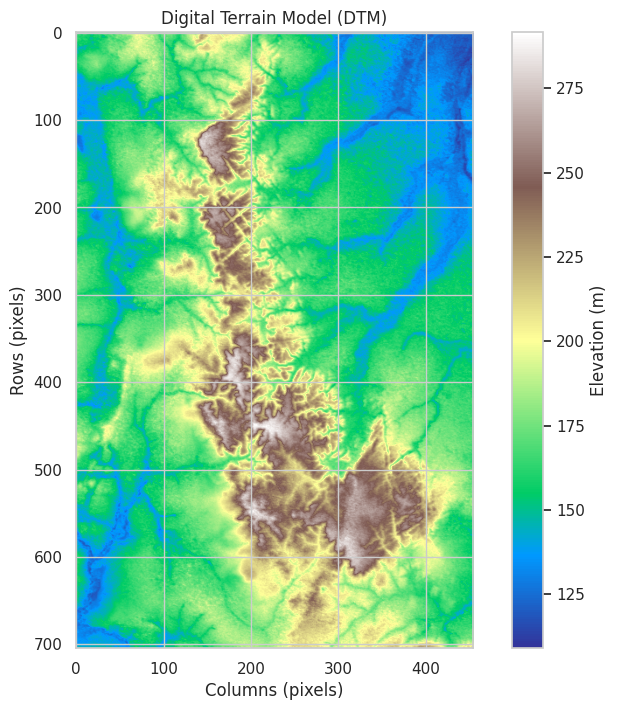

In [6]:
# Cell: Visualize Raster
file_path = '/kaggle/input/geotiffs/apiacas_geotiff_hh.tif'
    # First visualization in grayscale (left)
visualize_raster(file_path)

#  9. Calculations

## 9.A. Hough Transform for Line Detection

In this section, we applied the Hough Transform to detect lines within the provided image. This algorithmic approach allows us to identify prominent features in the image, which in this case are the straight lines that represent geometric patterns or structures.

### Code Explanation:
This code performs the following steps:
1. **Image Loading**: The image is loaded into the program for processing.
2. **Preprocessing**: The image may undergo normalization or other preprocessing steps to enhance the detection of lines.
3. **Canny Edge Detection**: Before applying the Hough Transform, we employ the Canny edge detection algorithm to highlight the edges in the image. This step is crucial as it simplifies the image for line detection.
4. **Apply Hough Transform**: The Hough Transform is executed on the edges detected from the previous step to find lines within the image.
5. **Visualization**: The resultant lines are drawn onto the original image, providing a clear visual representation of the detected features.

### Results:
The detected lines are displayed alongside the edges image. This visual output demonstrates the effectiveness of the Hough Transform in identifying geometric patterns within the image.

### Future Applications:
The data obtained from this analysis can be utilized in future interactions or projects. For example:
- **Pattern Recognition**: These detected lines can serve as key features in pattern recognition tasks.
- **Further Analysis**: The properties of the detected lines (such as length, angle, and position) can be analyzed in conjunction with other data sets for comprehensive spatial analysis.
- **Machine Learning Integration**: The lines detected can be used as input features for training machine learning models, contributing to tasks like classification or segmentation.

This section illustrates the application of algorithmic feature detection techniques in image processing and sets the stage for further exploration and analysis in future projects.

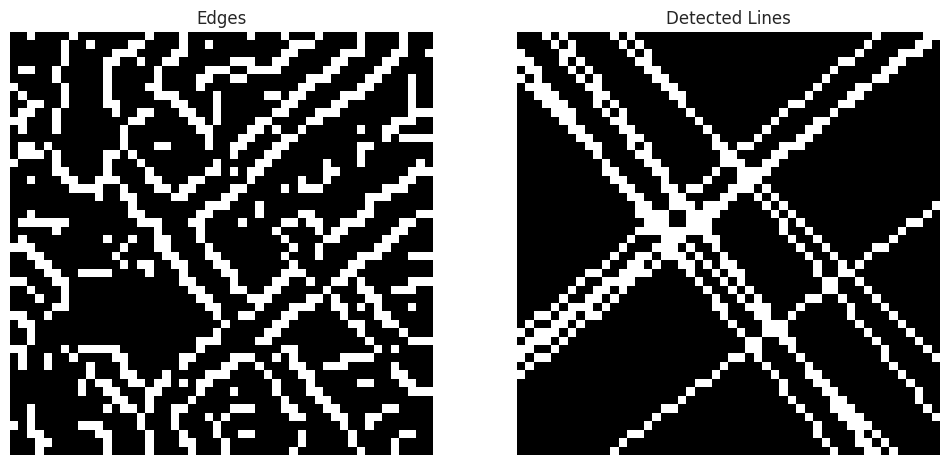

array([[  0,   0,   0, ...,   0, 255, 255],
       [  0,   0,   0, ..., 255, 255,   0],
       [255,   0,   0, ..., 255,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [7]:
file_path = '/kaggle/input/geotiffs/apiacas_geotiff_hh.tif'
hough_transform_apply(file_path, 
                      x_start=150, 
                      y_start=180, 
                      width=50, 
                      height=50, 
                      low_threshold=5, 
                      high_threshold=20, 
                      hough_threshold=30)

## 9.B. Slope Calculation

To calculate the slope of the terrain, we utilized the elevation data extracted from the Digital Terrain Model (DTM). The `np.gradient()` function was applied to the smoothed elevation data to compute the variations in the x and y directions. The slope was then obtained using the formula:

\[
\text{slope} = \arctan\left(\sqrt{\left(\frac{\partial z}{\partial x}\right)^2 + \left(\frac{\partial z}{\partial y}\right)^2}\right)
\]

where \( z \) represents elevation. The slope was converted from radians to degrees for easier interpretation.

### Slope Visualization

The resulting slope was visualized using a plot, providing a clear representation of the terrain variations, which is essential for identifying geomorphological features and potential archaeological sites.

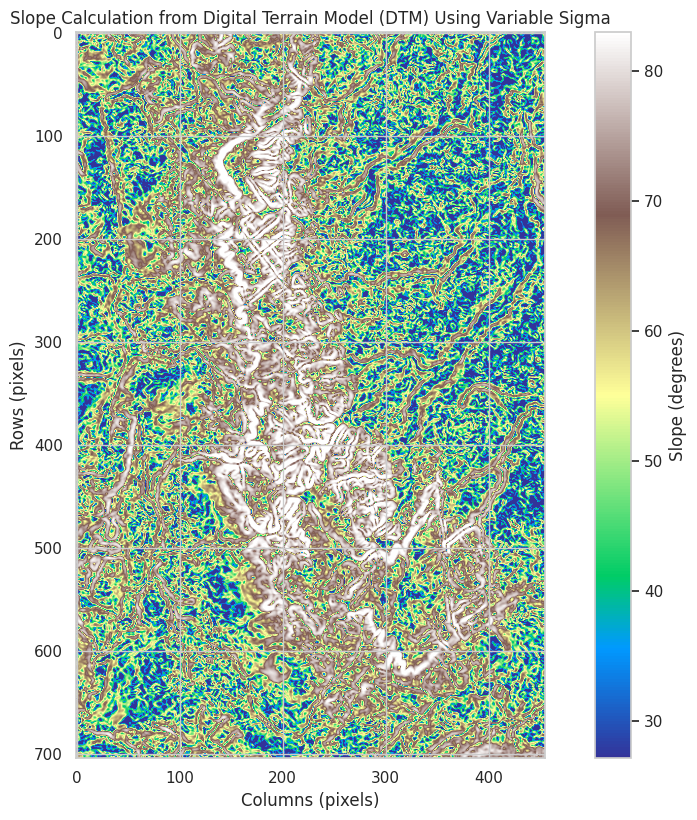

In [8]:
file_path = '/kaggle/input/geotiffs/apiacas_geotiff_hh.tif'
geoTiff_data, profile = load_raster(file_path)
# Cell: Slope Calculation and Plot with Sigma Control
sigma_value = 1.5  # Adjustable sigma value

dtm_data = geoTiff_data[0]  # Extract elevation data from first band
slope_data = calculate_slope(dtm_data)  # Your slope calculation function

mean_val = np.nanmean(slope_data)
std_val = np.nanstd(slope_data)

# Ensure vmin is not negative since slope values are physically non-negative
vmin = max(0, mean_val - sigma_value * std_val)
vmax = mean_val + sigma_value * std_val

# Guarantee vmax > vmin, adjust if necessary (edge case)
if vmax <= vmin:
    vmax = vmin + 1e-6  # minimal positive delta

masked_slope = np.ma.masked_invalid(slope_data)
norm = colors.Normalize(vmin=vmin, vmax=vmax)

plt.figure(figsize=(10, 8))
plt.imshow(masked_slope, cmap='terrain', norm=norm)
plt.colorbar(label='Slope (degrees)')
plt.title('Slope Calculation from Digital Terrain Model (DTM) Using Variable Sigma')
plt.xlabel('Columns (pixels)')
plt.ylabel('Rows (pixels)')
plt.tight_layout(pad=0)
plt.show()

# 10. Extracted Area

The extracted area was selected based on its known characteristics, which match the patterns of anomalies we aim to identify. This specific region was chosen due to the certainty that it contains clear examples of human-induced alterations.

### Selection Criteria

- **Coordinates**: The center of the extracted area is defined by the pixel coordinates. These coordinates correspond to a location within the raster image that is known to exhibit distinct features indicative of anomalies.
- **Radius**: A radius of 20 pixels was used to delineate the area for extraction. This size was chosen to encompass sufficient context around the center point, ensuring that the analysis captures the relevant surrounding details.
  
### Purpose of Extraction

By focusing on this specific area, we can effectively analyze the presence and characteristics of anomalies. The visualization of both the original and processed images allows for a comprehensive comparison, demonstrating how preprocessing techniques can enhance the visibility of relevant patterns. This approach is essential for validating our detection algorithms and improving our understanding of anomalous behaviors in geospatial data.

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


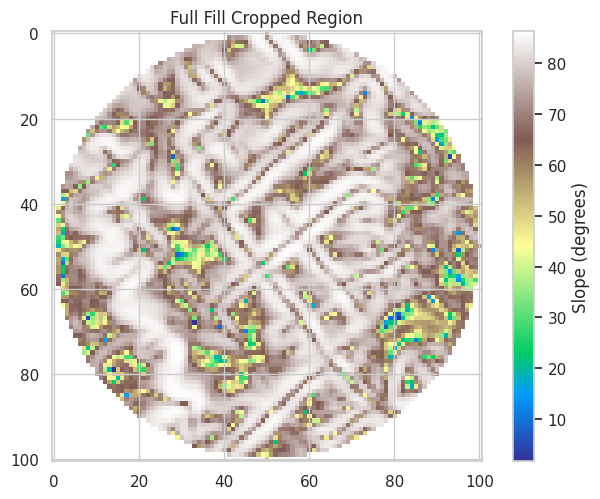

In [9]:
# Configurable parameters
x_center = 180
y_center = 210
radius = 50

# Compute the circular cropped region (assuming your function is defined)
cropped_region = crop_circular_region(slope_data, (x_center, y_center), radius)

# Create mask for valid (non-NaN) values
if cropped_region.ndim == 3:
    mask_valid = ~np.isnan(cropped_region).all(axis=2)
else:
    mask_valid = ~np.isnan(cropped_region)
rows_non_nan, cols_non_nan = np.where(mask_valid)

x_min, x_max = cols_non_nan.min(), cols_non_nan.max()
y_min, y_max = rows_non_nan.min(), rows_non_nan.max()

# Crop the image according to bounds
cropped_box = cropped_region[y_min:y_max+1, x_min:x_max+1]

# Replace infinities with NaN for safety
cropped_box = np.where(np.isfinite(cropped_box), cropped_box, np.nan)

# Mask invalid (NaN) values
masked_cropped_box = np.ma.masked_invalid(cropped_box)

# Obtain a copy of the 'terrain' colormap using the new matplotlib API
cmap = matplotlib.colormaps['terrain'].copy()
cmap.set_bad(color='white')  # Set color for masked (NaN) values

# Define color scaling limits ignoring NaNs
vmin = np.nanmin(cropped_box)
vmax = np.nanmax(cropped_box)

# (Optional) If slope should be non-negative, enforce vmin >= 0 here:
vmin = max(0, vmin)

# Plot the masked cropped region
plt.imshow(masked_cropped_box, cmap=cmap, interpolation='none', vmin=vmin, vmax=vmax)
plt.title('Full Fill Cropped Region')
plt.colorbar(label='Slope (degrees)')
plt.tight_layout(pad=0)
plt.show()

## &uarr; You may notice a red warning above the image.

### What is this?

An image file is a matrix of data. A LIDAR image has different data than an optical image, this warning means that some matrix data that was expected in one was not found. Nothing that prevents you from viewing and working with the image.

# 11. More data analysis, now of the cropped image

In [10]:
file_path = '/kaggle/input/geotiffs/apiacas_geotiff_hh.tif'
geoTiff_data, profile = load_raster(file_path)
# Assume que você já carregou o raster e tem as funções carregadas e disponíveis

# Define your crop indices (modify as needed)
y_start, y_end = 200, 300  # rows
x_start, x_end = 400, 500  # columns

# Load raster data and profile
geoTiff_data, profile = load_raster(file_path)

# Extract 2D array
data_2d = geoTiff_data[0]

# Calculate geo-coordinates of the recorte corners
top_left_x, top_left_y = xy(profile['transform'], y_start, x_start)
bottom_right_x, bottom_right_y = xy(profile['transform'], y_end, x_end)

# Compute size of the recorte
recorte_width = x_end - x_start + 1
recorte_height = y_end - y_start + 1

# Create affine transform for the recorte
new_affine = Affine.translation(top_left_x, top_left_y) * Affine.scale(
    profile['transform'][0], profile['transform'][4]
)

# Build new profile for the recorte
new_profile = profile.copy()
new_profile['width'] = recorte_width
new_profile['height'] = recorte_height
new_profile['transform'] = new_affine

# Extract recorte data from original array
recorte_data = data_2d[y_start:y_end+1, x_start:x_end+1]

# Calculate center coordinates of the recorte
center_x, center_y = xy(new_profile['transform'], recorte_height/2, recorte_width/2)

# Run descriptive_statistics
stats = descriptive_statistics(recorte_data, new_profile)

# Prepare the info table
summary_df = pd.DataFrame({
    'Property': [
        'Longitude (center)',
        'Latitude (center)',
        'Bounds',
        'Resolution',
        'CRS',
        'Transform'
    ],
    'Value': [
        center_x,
        center_y,
        (top_left_x, bottom_right_y, bottom_right_x, top_left_y),
        (profile['transform'][0], profile['transform'][4]),  # pixel size in x and y
        profile['crs'],
        profile['transform']
    ],
    'Comments': [
        'Recorte center longitude',
        'Recorte center latitude',
        'Extent of the recorte in geo-coordinates',
        'Spatial resolution (pixel size in x and y)',
        'Coordinate reference system (CRS)',
        'Affine transformation matrix'
    ]
})

# Aplicar a formatação na DataFrame toda
summary_df['Value'] = summary_df['Value'].apply(format_value)

# Imprimir o resultado formatado
print("Recorte Statistics Summary:")
print(summary_df)

# Além disso, exibir estatísticas detalhadas
print("\nDetailed Statistics:")
for key, value in stats.items():
    print(f"{key}: {value}")

pp = pprint.PrettyPrinter(indent=3)
pp.pprint(profile)

Recorte Statistics Summary:
             Property                                              Value  \
0  Longitude (center)                                           -57.8228   
1   Latitude (center)                                            -8.1414   
2              Bounds             (-57.8369, -8.1550, -57.8092, -8.1272)   
3          Resolution                                  (0.0003, -0.0003)   
4                 CRS                             (proj, datum, no_defs)   
5           Transform  (0.0003, 0.0000, -57.9482, 0.0000, -0.0003, -8...   

                                     Comments  
0                    Recorte center longitude  
1                     Recorte center latitude  
2    Extent of the recorte in geo-coordinates  
3  Spatial resolution (pixel size in x and y)  
4           Coordinate reference system (CRS)  
5                Affine transformation matrix  

Detailed Statistics:
width: 101
height: 101
area_covered: 0.0007871141975308642
altitude_min: 129.5766

# 12. Finally, we save the files in the output folder.

## Note that we have a warning similar to the previous one.

In [11]:
# Cell: Save file to working 
plt.imsave('slope.png', slope_data, cmap='terrain')
# Optional: confirmation message
print("Image saved as 'slope.png' in the current working directory.")
masked_data = np.ma.masked_invalid(cropped_box)
# Save the masked array as PNG, avoiding warnings
plt.imsave('slope_c.png', masked_data, cmap='terrain')
print("Image saved as 'slope_c.png'")

Image saved as 'slope.png' in the current working directory.
Image saved as 'slope_c.png'


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


# 13. Image Analysis Submission to OpenAI Vision

This document outlines our successful endeavor to submit an image for analysis using the OpenAI model. The process involved several key steps, all of which contributed to obtaining insights from the image.

## Objective

The primary goal was to analyze a specific image leveraging OpenAI's advanced model capabilities. By submitting this image, we aimed to extract valuable information regarding surface features and anomalies, especially in the context of geospatial data.

## Steps Followed

1. **Image Selection**:
   - Chose an appropriate image derived from LIDAR elevation data to be analyzed.
   - Ensured the image captured relevant surface features such as terrain anomalies.

2. **API Setup**:
   - Configured the environment to access the OpenAI API, including obtaining the necessary API keys.
   - Used `kaggle_secrets` to securely handle the API keys within the Kaggle environment.

3. **Image Encoding**:
   - Converted the image to a Base64 format suitable for transmission across the API.
   - Ensured the encoded image could be correctly interpreted by the AI model.

4. **Prompt Definition**:
   - Crafted a clear and comprehensive prompt to guide the AI model in understanding the context of the image.
   - Example prompt: "You are being shown a slope image derived from LIDAR elevation data, which reveals terrain features. Describe surface features in plain English."

5. **API Submission**:
   - Submitted the encoded image along with the prompt to the OpenAI model using the API.
   - Handled any potential errors during submission to ensure smooth operations.

6. **Results Display**:
   - Retrieved and printed the model's response clearly, showcasing the insights derived from the analysis.
   - Included relevant details about the model used and the dataset involved for reference.

## Conclusion

This innovative approach allowed us to harness the power of AI to analyze complex geospatial data effectively. The insights obtained from the model can significantly enhance our understanding of the terrain features within the submitted image.

### Future Work

- Explore the analysis of additional images to identify patterns or significant anomalies in various terrains.
- Refine prompts and image selection to improve the quality of insights generated by the model.

## Acknowledgments

Special thanks to the OpenAI team for providing such powerful tools for image analysis, which facilitate deeper understanding and exploration of data.


In [12]:
# Retrieve user secrets for OpenAI API
user_secrets = UserSecretsClient()
openaikey = user_secrets.get_secret("Z_Challenge_Key")

# Initialize OpenAI client
client = OpenAI(api_key=openaikey)

# Path to your image
image_path = "/kaggle/input/z-challenge-files/slope_c.png"

# Get the Base64 string of the image
base64_image = encode_image(image_path)

# Create a response using the OpenAI client
response = client.responses.create(
    model="gpt-4.1",
    input=[
        {
            "role": "user",
            "content": [
                {
                    "type": "input_text",
                    "text": "You are being shown a slope image derived from LIDAR elevation data, "
                             "it reveals terrain features such as raised mounds, geometric depressions, "
                             "terracing, or other patterns that may not be visible in standard imagery. "
                             "Describe surface features in plain English."
                },
                {
                    "type": "input_image",
                    "image_url": f"data:image/jpeg;base64,{base64_image}",
                },
            ],
        }
    ],
)

# Define the dataset ID
dataset_id = 'marcelocruzeta/z-challenge-files'  # Replace with your actual dataset ID

# Print dataset ID and model version in a formatted way
print("\n--- Summary of Results ---")
print(f"Dataset ID: {dataset_id}")
print(f"Model Version: {response.model}\n")  # Accessing the model version directly from response

# Print output text with a clear label
print("Generated Output Text:")
print("-------------------------")
print(response.output_text)  # Output the main text response


--- Summary of Results ---
Dataset ID: marcelocruzeta/z-challenge-files
Model Version: gpt-4.1-2025-04-14

Generated Output Text:
-------------------------
This slope image shows a landscape with several distinct, linear features crossing the area, forming a rough grid or crisscross pattern. These lines appear to be raised or embanked, as they contrast sharply with the surrounding terrain. Some areas along the lines seem to have geometric or rectilinear depressions or segments within them, possibly suggesting artificial modification. The image also has scattered small mounds and terrace-like forms that follow the pattern of the larger linear features. The overall impression is one of complex, organized surface modifications rather than purely natural shapes.


# 14. Topography Tile Downloader using OpenTopography API

This script retrieves topography tiles based on KLM identifiers found in a CSV file. It uses the OpenTopography API to download elevation data and displays selected records in a formatted table.

## Dependencies

The script requires the following Python libraries:
- `os`
- `requests`
- `kaggle_secrets`
- `pandas`
- `tabulate`

You can install the required libraries using pip if they are not already installed:
```bash
pip install requests pandas tabulate

# 15. Dealing with GEE

## A. Specifies parameters for the GEE and Drive

In [13]:
# Cell: GEE connection
user_secrets = UserSecretsClient()
user_credential = user_secrets.get_gcloud_credential()
user_secrets.set_tensorflow_credential(user_credential)
ee.Authenticate()
ee.Initialize(project='openai-to-z-challenge-461613')
print(ee.String('Hello from the Earth Engine servers!').getInfo())

Hello from the Earth Engine servers!


## B. Cloud-Free Sentinel-2 Image Visualization with Enhanced Masking

This code snippet processes Sentinel-2 satellite imagery to produce a cloud-free composite image over a defined area of interest (AOI).

- **Area of Interest (AOI):** Defined as a geographic point with longitude -57.898488 and latitude -8.128366.
- **Date Range:** Images between January 1, 2018, and May 31, 2025, are considered.
- **Cloud Masking Parameters:** Thresholds are set to identify and mask clouds and their shadows effectively.
- **Image Collection:** A Sentinel-2 surface reflectance collection is obtained and filtered.
- **Cloud and Shadow Masking:** A custom cloud and shadow mask function (`add_cld_shdw_mask`) is applied to all images in the collection.
- **Composite Image:** The median of the masked images is computed to reduce residual clouds.
- **Visualization:** The resulting cloud-free composite is displayed on an interactive folium map centered on the AOI, showing natural color bands (B4 - red, B3 - green, B2 - blue).

This approach leverages Google Earth Engine's powerful cloud masking capabilities and folium's interactive mapping to create a clean, visually appealing satellite image for further analysis or presentation.

**Code updated to new version - earthengine_api-1.5.20**

In [14]:
# Cell: Show filtered image without clouds
# Parameters and area of interest
AOI = ee.Geometry.Point(-57.898488,  -8.128366)
START_DATE = '2018-01-01'
END_DATE = '2025-05-31'
CLOUD_FILTER = 60
CLD_PRB_THRESH = 50
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 2
BUFFER = 100

# Get the collection
collection = get_s2_sr_cld_col(AOI, START_DATE, END_DATE)

# Add Earth Engine layer method to folium
folium.Map.add_ee_layer = add_ee_layer

# Create the final collection with cloud and shadow mask applied
masked_collection = collection.map(add_cld_shdw_mask)

# Take the median to reduce remaining clouds
median_image = masked_collection.median()

# Create the visual map
center = AOI.centroid().coordinates().getInfo()
m = folium.Map(location=[center[1], center[0]], zoom_start=14)

# Display the final cloud-free image
m.add_ee_layer(median_image,
               {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000, 'gamma': 1.1},
               'Sentinel-2 cloud-free image with enhanced mask')
folium.Marker(
    location=[-8.125366, -57.898488],
    popup="Reference Image of Supposed Ratanabá",
    icon=folium.Icon(color="red") 
).add_to(m)

# Show map
m

In [15]:
# Load your OpenTopography API key (adjust secret label as needed)

# Select the database and records to be used in the process
csv_path='/kaggle/input/archaeological-geodesy/minus5toMinus13.csv'
col = 'KLM'
# List of records to be extracted from the database 
col_list=['acrq58', 'acds2', 'acrs35', 'acrp11', 'acrg44']
# col_list=['acrq58']

API_Key = load_secret('OpenTopography')  # Replace with your secret label
if API_Key is None:
    raise ValueError("API key for OpenTopography not loaded.")


df = selecionar_registros(csv_path, col, col_list, show_table=True)


# Execute the process
folder_path = "/kaggle/working/SRTMGL3"
os.makedirs(folder_path, exist_ok=True)

"""
The line below has been commented out to avoid unnecessary 
use of the OpenTopography system. 
The free service serves thousands of users. 
The fewer unnecessary requests the better.
"""

# download_multiple_tiles(klm_list, df, area_km2=10, save_dir='/kaggle/working/SRTMGL3')

List of selected records:
╒════════╤══════════════════════════╤════════════╤═════════════╕
│  KLM   │        Site Name         │  Latitude  │  Longitude  │
╞════════╪══════════════════════════╪════════════╪═════════════╡
│ acrg44 │ Acre Geoglyph 150 x 111m │  -9.66152  │  -67.2353   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrp11 │ Acre Parallelogram 177m  │  -9.71378  │  -67.1203   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrs35 │     Acre Square 158m     │  -9.71645  │  -67.1232   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acds2  │ Acre Double Square 175m  │  -9.75805  │  -67.1945   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrq58 │   Acre Quadrangle 114m   │  -9.75812  │  -67.1945   │
╘════════╧══════════════════════════╧════════════╧═════════════╛


'\nThe line below has been commented out to avoid unnecessary \nuse of the OpenTopography system. \nThe free service serves thousands of users. \nThe fewer unnecessary requests the better.\n'

## C. Processes the images in GEE and saves them to Google Drive.

In [16]:
# Parameters and area of interest
AOI = ee.Geometry.Point(-67.123219, -9.716453)
START_DATE = '2018-01-01'
END_DATE = '2025-05-31'
CLOUD_FILTER = 60
CLD_PRB_THRESH = 50
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 2
BUFFER = 100

# Get the collection
col = get_s2_sr_cld_col(AOI, START_DATE, END_DATE)

# Create the final collection with cloud and shadow mask applied
col_masked = col.map(add_cld_shdw_mask)

# Take the median to reduce remaining clouds
median_img = col_masked.median()

# Select the database and records to be used in the process
csv_path='/kaggle/input/archaeological-geodesy/minus5toMinus13.csv'
col = 'KLM'
# List of records to be extracted from the database 
col_list=['acrq58', 'acds2', 'acrs35', 'acrp11', 'acrg44']
# col_list=['acrq58']
selected_records = selecionar_registros(csv_path, col, col_list, show_table=True)


for idx, row in selected_records.iterrows():
    lon = row['lon']
    lat = row['lat']
    nome = row['KLM']
    # Commented not to process files in the testing phase
    # processar_registro(lon, lat, nome)

List of selected records:
╒════════╤══════════════════════════╤════════════╤═════════════╕
│  KLM   │        Site Name         │  Latitude  │  Longitude  │
╞════════╪══════════════════════════╪════════════╪═════════════╡
│ acrg44 │ Acre Geoglyph 150 x 111m │  -9.66152  │  -67.2353   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrp11 │ Acre Parallelogram 177m  │  -9.71378  │  -67.1203   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrs35 │     Acre Square 158m     │  -9.71645  │  -67.1232   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acds2  │ Acre Double Square 175m  │  -9.75805  │  -67.1945   │
├────────┼──────────────────────────┼────────────┼─────────────┤
│ acrq58 │   Acre Quadrangle 114m   │  -9.75812  │  -67.1945   │
╘════════╧══════════════════════════╧════════════╧═════════════╛


## D. Download files from Google Drive

In [17]:
user_secrets = UserSecretsClient()
secret_value_1 = user_secrets.get_secret("GEEE Folder")

url = f'https://drive.google.com/drive/folders/{secret_value_1}'
 # Commented not to process files in the testing phase
# gdown.download_folder(url, quiet=False)


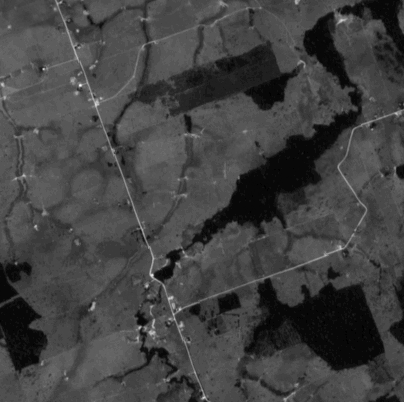
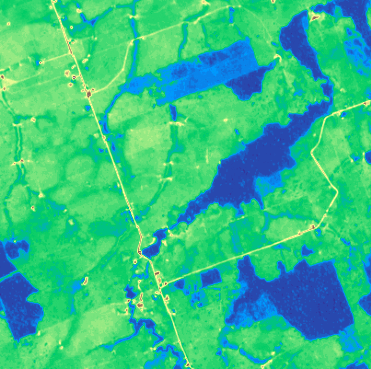


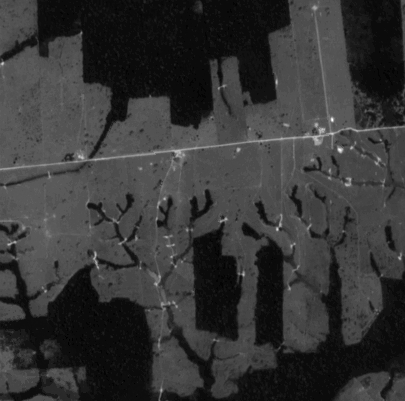
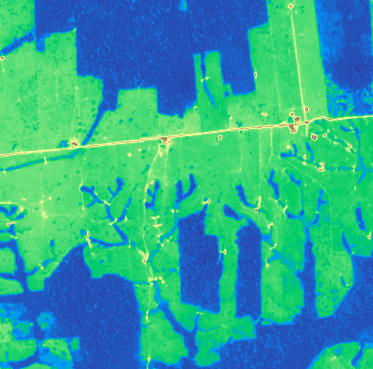


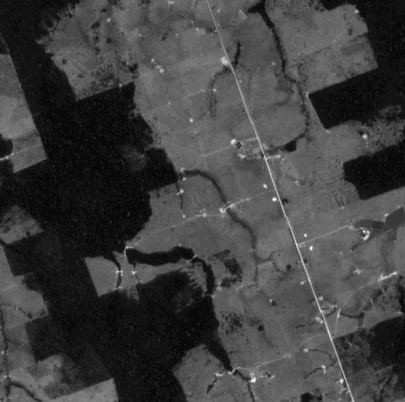
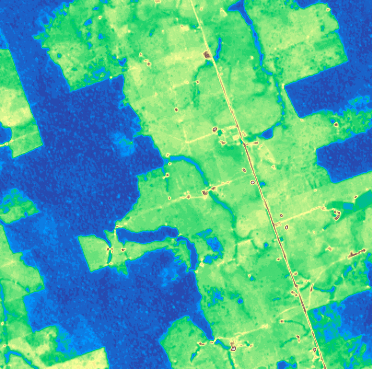


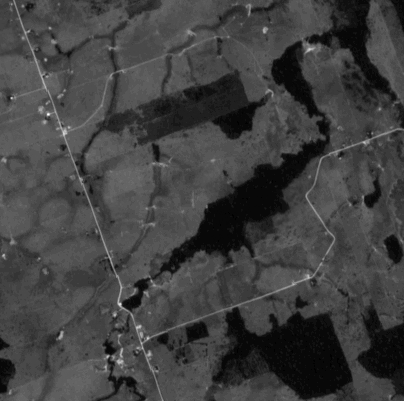
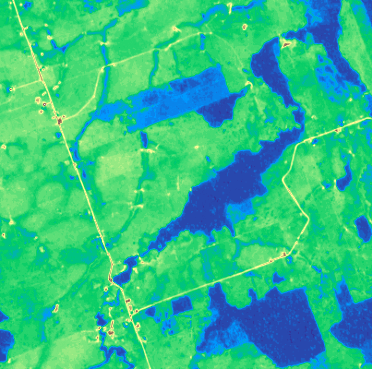


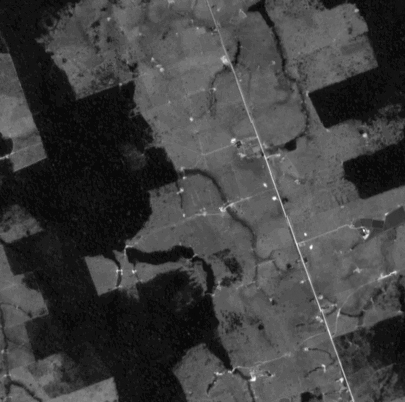
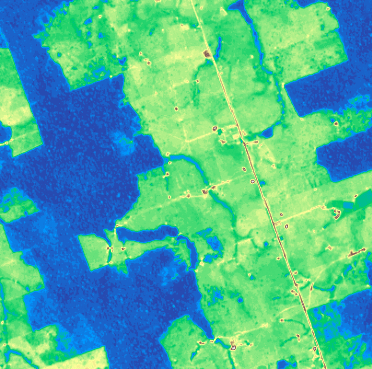

In [18]:
# Path to the directory with files and json file
directory = '/kaggle/input/z-challenge-files/GEEE'
json_file = '/kaggle/input/z-challenge-files/analysis_logs.json'
display_analysis(directory, json_file)

# 16. Batch processing of GEE images in GPT Vision
This next cell calls the process_image function, which submits the images for analysis by GPT Vision and returns a json file with details about the analysis.

In [19]:
input_directory = '/kaggle/input/z-challenge-files/GEEE'
output_directory = '/kaggle/working/GEEE'
log_file = os.path.join(output_directory, 'analysis_logs.json')

# Create output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Process all images
# Commented not to process files in the testing phase
# process_images(input_directory, output_directory, log_file)

## 16.A.  Show analysis



# 17. Next Step in the Saga
The next step in our quest to find the lost city of Z, 
or as the locals call it here, Ratanabá, is to select an area to be 
investigated in the forest, as it is not possible to analyze this 
entire area at once, we need to divide the total chosen area into 
smaller tile and analyze each one of them.

Next, we will demonstrate the area we intend to analyze and how we 
intend to divide it.



In [20]:
# Define the southwest and northeast corners
southwest = [-9.25, -73.00]  # Southwest corner (SW)
northeast = [-7.35, -70.35]  # Northeast corner (NE)
zoom_start = 7

# Constants
km_per_degree_latitude = 111.32  # km per degree of latitude

# Calculate the approximate side length for a square of approximately 300 km²
side_length_km = 17.32  # Side length (in km)
lat_length = side_length_km / km_per_degree_latitude  # in degrees for latitude

# Function to calculate km per degree of longitude based on latitude
def km_per_longitude(latitude):
    return 111.32 * abs(math.cos(math.radians(latitude)))

# Prepare the map centered at the midpoint of the defined area
map_center = [(-9.25 + -7.35) / 2, (-73.00 + -70.35) / 2]
m = folium.Map(location=map_center, zoom_start=zoom_start)

# Initialize a counter for square numbering
square_counter = 1

# Generate squares and add them to the map, starting from NW to SE
lat = northeast[0]  # Start from the northernmost latitude
while lat > southwest[0]:  # Go until the southernmost latitude
    long = southwest[1]  # Reset longitude to the southwest longitude for each new row
    while long < northeast[1]:  # Go until the easternmost longitude
        # Calculate the length of longitude in degrees based on the current latitude
        long_length = side_length_km / km_per_longitude(lat)  # in degrees for longitude
        
        # Define bounds for the rectangle
        bounds = [[lat, long], [lat - lat_length, long + long_length]]  # Adjust lat for downwards
        Rectangle(bounds=bounds, color='blue', fill=True, fill_opacity=0.2).add_to(m)

        # Calculate the center of the square for numbering
        center_lat = lat - (lat_length / 2)  # Adjust for downwards
        center_long = long + (long_length / 2)

        # Add a marker with the square number at the center
        folium.Marker(
            location=[center_lat, center_long],
            icon=folium.DivIcon(html=f'<div>{square_counter}</div>')
        ).add_to(m)

        long += long_length  # Move to the next square
        square_counter += 1  # Increment the square number
    lat -= lat_length  # Move to the next row (downwards)

# Display the map inline
m

# 18. Here we generate the coordinates of each tile
Now that we have defined the tiles that we will order from 
the OpenThopography website, 
we will continue the process of preparing the order.</br>
First, we will adjust the geographic coordinates to the 
standard used by the website.

In [21]:
# Define the southwest and northeast corners
southwest = [-9.25, -73.00]  # Southwest corner (SW)
northeast = [-7.35, -70.35]  # Northeast corner (NE)

# Constants
km_per_degree_latitude = 111.32  # km per degree of latitude

# Calculate the approximate side length for a square of approximately 300 km²
side_length_km = 17.32  # Side length (in km)
lat_length = side_length_km / km_per_degree_latitude  # in degrees for latitude

# Function to calculate km per degree of longitude based on latitude
def km_per_longitude(latitude):
    return 111.32 * abs(math.cos(math.radians(latitude)))

# Initialize a list to hold tile data with corner coordinates
tile_data = []  # List to hold tile information

# Generate tiles, starting from the northernmost latitude
lat = northeast[0]
while lat > southwest[0]:  # Go until the southernmost latitude
    long = southwest[1]  # Reset longitude to southwest longitude for each new row
    while long < northeast[1]:  # Go until the easternmost longitude
        # Calculate the length of longitude in degrees based on the current latitude
        long_length = side_length_km / km_per_longitude(lat)  # in degrees for longitude
        
        # Calculate all four corner coordinates
        nw = [lat, long]                             # Northwest corner
        ne = [lat, long + long_length]             # Northeast corner
        se = [lat - lat_length, long + long_length] # Southeast corner
        sw = [lat - lat_length, long]               # Southwest corner

        # Append tile information to the list
        tile_data.append({
            'Tile': len(tile_data) + 1,
            'NW_Latitude': nw[0],
            'NW_Longitude': nw[1],
            'NE_Latitude': ne[0],
            'NE_Longitude': ne[1],
            'SE_Latitude': se[0],
            'SE_Longitude': se[1],
            'SW_Latitude': sw[0],
            'SW_Longitude': sw[1],
            'Processed': ''  # Initialize as unprocessed
        })

        long += long_length  # Move to the next tile
    lat -= lat_length  # Move to the next row (downwards)

# Convert tile data to a DataFrame for better visualization and manipulation
tile_df = pd.DataFrame(tile_data)

# Display the DataFrame
print(tile_df.head())  # Show the first few rows for validation

# Save the DataFrame to a CSV file
tile_df.to_csv('tile_data.csv', index=False)  # Do not include row indices

   Tile  NW_Latitude  NW_Longitude  NE_Latitude  NE_Longitude  SE_Latitude  \
0     1        -7.35    -73.000000        -7.35    -72.843123    -7.505587   
1     2        -7.35    -72.843123        -7.35    -72.686247    -7.505587   
2     3        -7.35    -72.686247        -7.35    -72.529370    -7.505587   
3     4        -7.35    -72.529370        -7.35    -72.372494    -7.505587   
4     5        -7.35    -72.372494        -7.35    -72.215617    -7.505587   

   SE_Longitude  SW_Latitude  SW_Longitude Processed  
0    -72.843123    -7.505587    -73.000000            
1    -72.686247    -7.505587    -72.843123            
2    -72.529370    -7.505587    -72.686247            
3    -72.372494    -7.505587    -72.529370            
4    -72.215617    -7.505587    -72.372494            


# 19. download the tiles from the OpenTopography site
With the tile coordinates already defined, we will use functions 
developed and explained previously to download the tiles.

In [22]:
csv_path = '/kaggle/input/archaeological-geodesy/tile_data_01.csv'
tile_numbers = [1]  # Replace with the desired tile numbers
save_dir = '/kaggle/working/'

# commented not to use OpenTopography site in vain
# download_tiles_from_csv(csv_path, tile_numbers, save_dir)

# 20. Showing one of the downloaded file from OpenTopography site

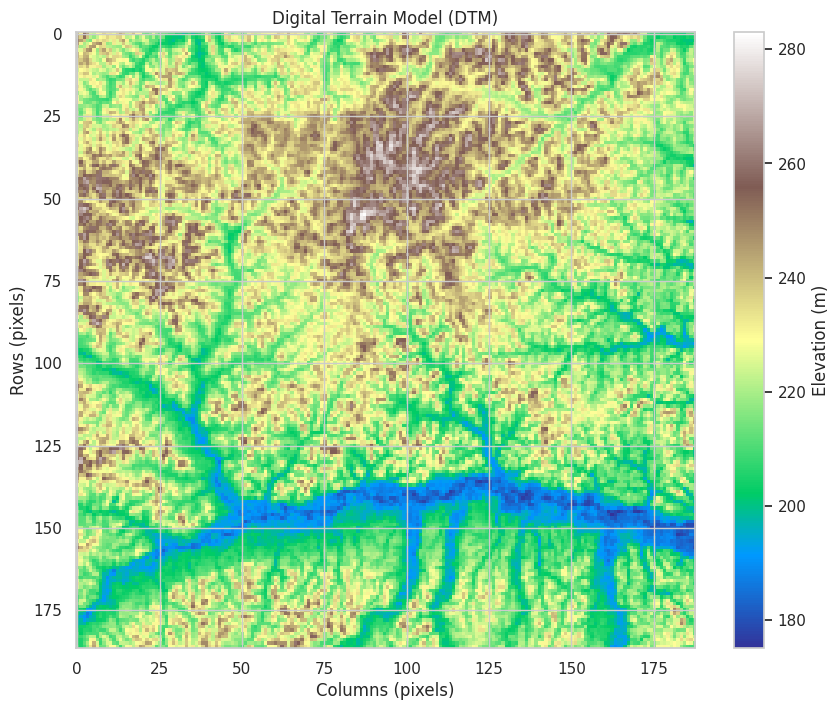

In [23]:
file_path = '/kaggle/input/images-of-tiles-1-to-17-with-analysis/1-17/tile_15.0.tif'
visualize_raster(file_path)

# 21. Next steps
Now we know that the image is being downloaded in the appropriate format 
for our research, we will process multiple images.</br>
We will analyze and save the information in a JSON file, 
just as we already did with the images where we knew there is geoglyphs.</br>
The big difference now is that we don't know what's ahead.
Will we discover something new !?!

# 22.  Dealing with a range of files
We thought it would be better to develop a function that downloads 
files from a range to make the job easier.</br>Instead of having to list 
the various files we are going to download, we just define the first and 
last ones in the range and the magic happens.

In [24]:
# Here we only test the selection process
csv_path = '/kaggle/input/archaeological-geodesy/tile_data_01.csv'
start_tile = 2
end_tile = 3
selected_tiles = filter_tiles_by_range(csv_path, start_tile, end_tile)

Selected data:
   Tile  NW_Latitude  NW_Longitude  NE_Latitude  NE_Longitude  SE_Latitude  \
1     2        -7.35    -72.843123        -7.35    -72.686247    -7.505587   
2     3        -7.35    -72.686247        -7.35    -72.529370    -7.505587   

   SE_Longitude  SW_Latitude  SW_Longitude  Processed  
1    -72.686247    -7.505587    -72.843123          0  
2    -72.529370    -7.505587    -72.686247          0  


# 23. Download the range
Selects a range of tiles to be requested from the OpenTopography website 


# 24. Analysis of the second set of images
Now we have our first set of images extracted from the Opentopography 
website and our json file with the data from the analysis performed
by Gpt Vision, with a prompt based on our first response, from the 
analysis of the initial image.</br>
From now on, we move on to a new phase of our research. As we use to 
say around here:

**\- Now this is a big dog fight!**

Now we are moving into an area where researchers have not yet been. 
Or at least have not recorded having been.</br>
The analysis shows that in some of the tiles studied there is possible 
human intervention in the landscape.</br>
In a subsequent visual analysis, it can be noted that some of these 
tiles show recent human activity with deforestation and construction 
of roads, buildings and the like.</br>
But some tiles in which the analysis shows these interventions in a 
subsequent visual analysis, what we see is an area completely covered 
by forest.</br>
This leads us to believe that we have patterns similar to the first ones 
used to train Gpt Vision!

In [25]:
csv_path = '/kaggle/input/archaeological-geodesy/tile_data_01.csv'
start_tile = 1 # First tile to be donwnloaded
end_tile = 17 # Last tile to be donwnloaded

# Create directory names based on the start and end tiles
base_dir = f"{start_tile}-{end_tile}"
save_dir = base_dir
output_dir = base_dir
log_file = f"{base_dir}/{base_dir}.json"

# Commented not to process files in the testing phase
# process_range_images(csv_path, start_tile, end_tile, save_dir, output_dir, log_file)


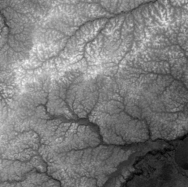
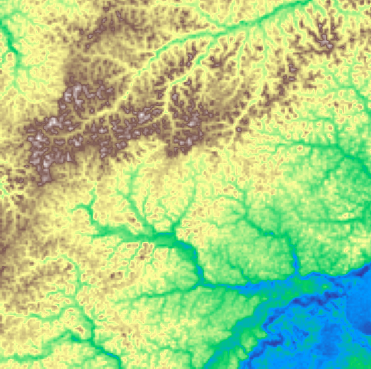


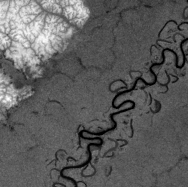
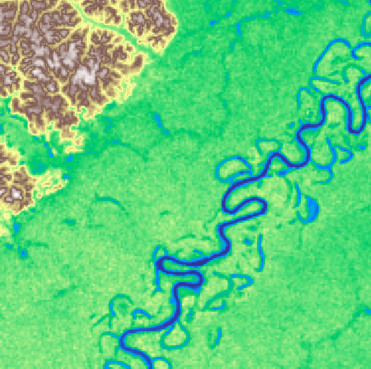


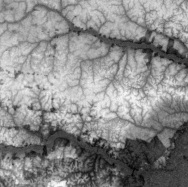
...
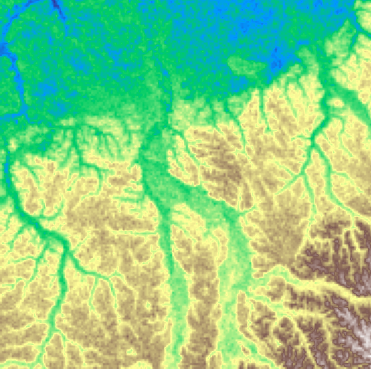


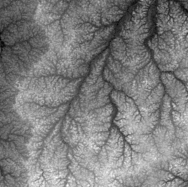
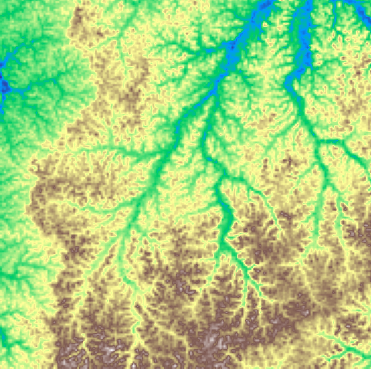


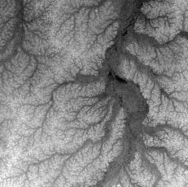
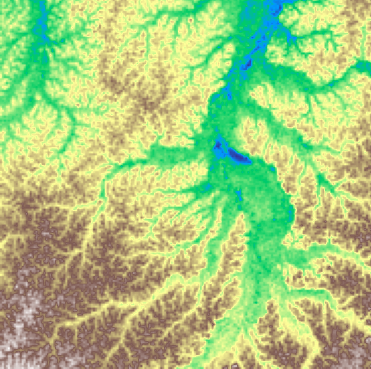

In [26]:
# Path to the directory with files and json file
directory = '/kaggle/input/images-of-tiles-1-to-17-with-analysis/1-17'
json_file = '/kaggle/input/images-of-tiles-1-to-17-with-analysis/1-17/1-17.json'
display_analysis(directory, json_file)

# 25. Apply slope to an image with the FOUND tag !!!
Applying the slope visualization to image tile_15.0.tif, we can see in 
the part highlighted with a red square, a picturesque elevation that, according 
to the Gpt Vision analysis, shows a: 

## Geometric Pattern !!! 😲

## Our first new possible discovery !!!

About the code:</br>
The highlight here is the ability to draw a square at a defined location 
in the image and then, using the data embedded in the GeoTIFF image, 
calculate the coordinates of the center of that square, which gives us 
the exact location of the anomaly we are seeing.

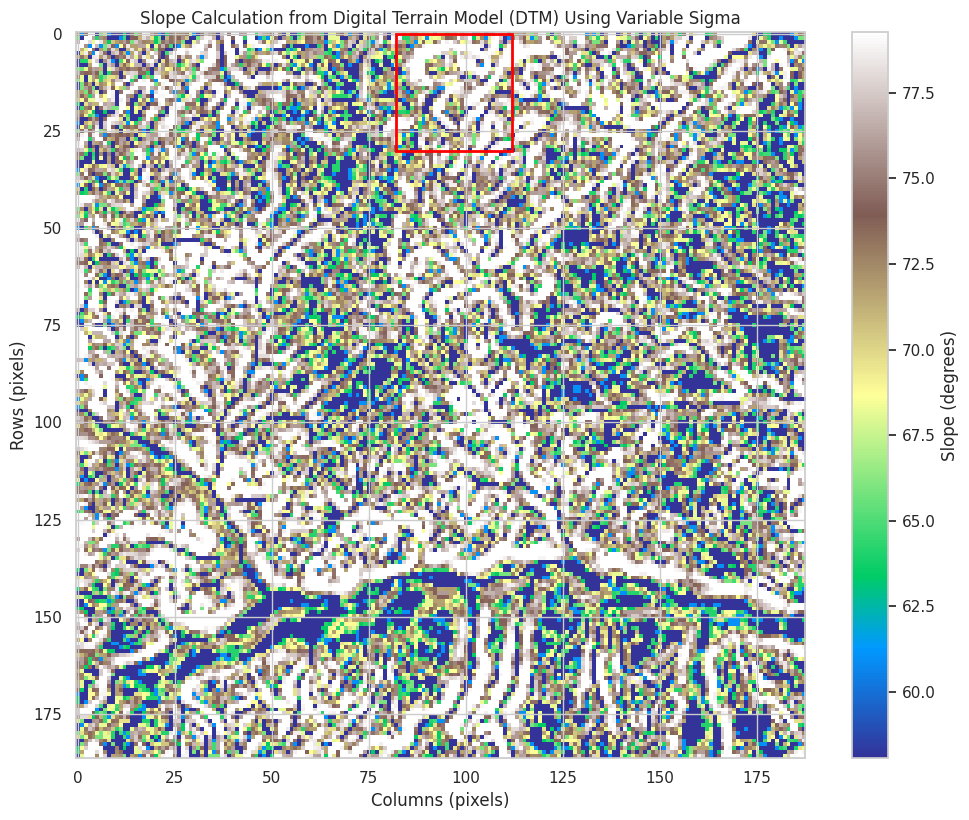

Center Coordinates (Geographic): (-70.72, -7.36)


In [27]:
file_path_15 = '/kaggle/input/images-of-tiles-1-to-17-with-analysis/1-17/tile_15.0.tif'
geoTiff_data_15, profile = load_raster(file_path_15)

# Cell: Slope Calculation and Plot with Sigma Control
sigma_value = 0.8

# Calculate slope data
dtm_data = geoTiff_data_15[0]  # Extract elevation data from the first band
slope_data = calculate_slope(dtm_data)  # Calculate slope

# Calculate mean and std deviation
mean_val = np.nanmean(slope_data)
std_val = np.nanstd(slope_data)

# Ensure vmin is not negative since slope values are physically non-negative
vmin = max(0, mean_val - sigma_value * std_val)
vmax = mean_val + sigma_value * std_val

# Guarantee vmax > vmin, adjust if necessary (edge case)
if vmax <= vmin:
    vmax = vmin + 1e-6  # minimal positive delta

masked_slope = np.ma.masked_invalid(slope_data)
norm = colors.Normalize(vmin=vmin, vmax=vmax)

plt.figure(figsize=(10, 8))
plt.imshow(masked_slope, cmap='terrain', norm=norm)
plt.colorbar(label='Slope (degrees)')
plt.title('Slope Calculation from Digital Terrain Model (DTM) Using Variable Sigma')
plt.xlabel('Columns (pixels)')
plt.ylabel('Rows (pixels)')

# Parameters for the square
center_x_in_pixels = 97  # Define the center x in pixels
center_y_in_pixels = 15   # Define the center y in pixels
size_in_pixels = 30        # Size of the square in pixels

# Calculate the square's lower left corner based on center and size
lower_left_x = center_x_in_pixels - (size_in_pixels / 2)
lower_left_y = center_y_in_pixels - (size_in_pixels / 2)

# Draw the square on the plot
square = patches.Rectangle((lower_left_x, lower_left_y), size_in_pixels, size_in_pixels,
                           linewidth=2, edgecolor='red', facecolor='none')
plt.gca().add_patch(square)

# Convert pixel coordinates to geographic coordinates using the profile's transform
transform = profile['transform']
center_geo_x = transform[0] * center_x_in_pixels + transform[2]  # Calculate geographic x
center_geo_y = transform[4] * center_y_in_pixels + transform[5]  # Calculate geographic y

# Show the plot
plt.tight_layout(pad=0)
plt.show()

# Print coordinates below the plot
print(f'Center Coordinates (Geographic): ({center_geo_x:.2f}, {center_geo_y:.2f})')

## Hough Transform for Line Detection

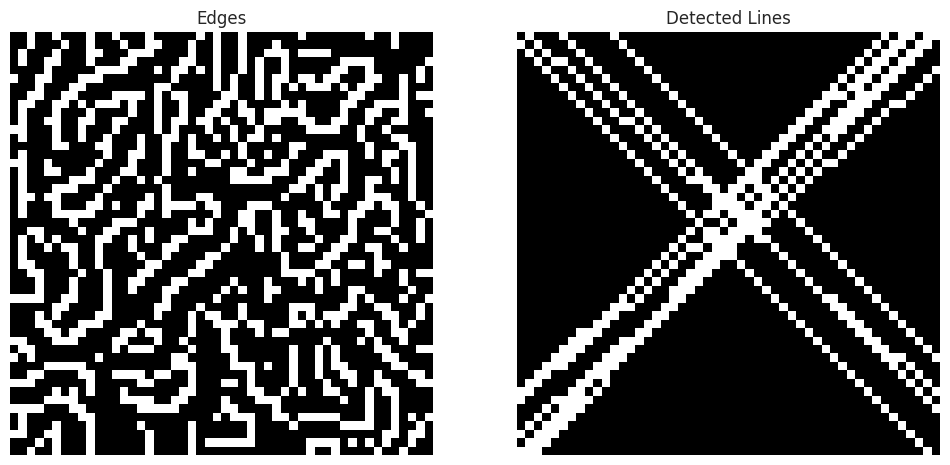

array([[  0, 255,   0, ...,   0, 255, 255],
       [255,   0, 255, ..., 255, 255,   0],
       [  0, 255,   0, ..., 255,   0,   0],
       ...,
       [255,   0, 255, ...,   0,   0,   0],
       [  0, 255, 255, ..., 255,   0,   0],
       [255, 255, 255, ...,   0, 255,   0]], dtype=uint8)

In [28]:
file_path = '/kaggle/input/images-of-tiles-1-to-17-with-analysis/1-17/tile_15.0.tif'
hough_transform_apply(file_path, 
                      x_start=100, 
                      y_start=24, 
                      width=50, 
                      height=50, 
                      low_threshold=5, 
                      high_threshold=20, 
                      hough_threshold=30)

# 26 Get an GEE image of this place.

The problem with the "free" database images from GEE is the resolution. 
You can't get the same resolution as the images from GEP 
(Goggle Earth Professional), for example.</br>
At least I couldn't!

In [29]:
# Cell: Show filtered image without clouds
# Parameters and area of interest
AOI = ee.Geometry.Point(-70.72,  -7.37)
START_DATE = '2018-01-01'
END_DATE = '2025-05-31'
CLOUD_FILTER = 60
CLD_PRB_THRESH = 50
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 2
BUFFER = 100

# Get the collection
collection = get_s2_sr_cld_col(AOI, START_DATE, END_DATE)

# Add Earth Engine layer method to folium
folium.Map.add_ee_layer = add_ee_layer

# Create the final collection with cloud and shadow mask applied
masked_collection = collection.map(add_cld_shdw_mask)

# Take the median to reduce remaining clouds
median_image = masked_collection.median()

# Create the visual map
center = AOI.centroid().coordinates().getInfo()
m = folium.Map(location=[center[1], center[0]], zoom_start=14)

# Display the final cloud-free image
m.add_ee_layer(median_image,
               {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000, 'gamma': 1.1},
               'Sentinel-2 cloud-free image with enhanced mask')
folium.Marker(
    location=[-7.37, -70.72],
    popup="Possible Ancient Ruin Found by Cruzeta",
    icon=folium.Icon(color="red") 
).add_to(m)

# Show map
m

# 27. Lack of image quality
I also couldn't insert images here in the markdown, but they are in this dataset anyway:

/kaggle/input/images-of-tiles-1-to-17-with-analysis/discoveries/

These are clippings I made from GEP that show the place we discovered in good quality. I will show then in a conde cell below.

Image: disc.png <!-- Increased image width -->,"Description The image of our square in the the right place. Try using these coordinates in your GEP and tell me if what you see in the images when you zoom in on the location isn't surprising. (-70.72, -7.37)"
Image: disc_6png.png <!-- Increased image width -->,"Description The image of the place as we see in GEP. The objective here is just to compare the definition of the image extracted from GEP with what we currently have from GEE, the quality is incomparable."
Image: disc_7png.png <!-- Increased image width -->,"Description The image of the place as we see in GEP, more zoom. The objective here is just to compare the definition of the image extracted from GEP with what we currently have from GEE, the quality is incomparable."
Image: disc_8png.png <!-- Increased image width -->,"Description The image of the place as we see in GEP, more zoom. The objective here is just to compare the definition of the image extracted from GEP with what we currently have from GEE, the quality is incomparable."
Image: disc_3.png <!-- Increased image width -->,"Description This 3D image from GEP is very intriguing. It looks like there was a landslide, perhaps due to a lot of rain, which is showing what appears to be a stone slab or something like that. What do you think? Or has someone already been there digging to find the lost treasures in the middle of the jungle?"
Image: disc_5.png <!-- Increased image width -->,"Description I have seen incredible things while flying over these forests. However, for obvious reasons, I could not stop and take a look.On this route, Cruzeiro do Sul - Tarauacá, it is a flight of more than an hour in a small plane flying over the forest, there is nothing but forest to see.I found these images so unusual that I even sent an email to IPHAN notifying them of the discovery.The first thing we do when we find an archaeological site is to notify the responsible government agency."

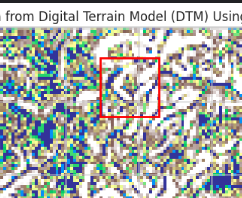
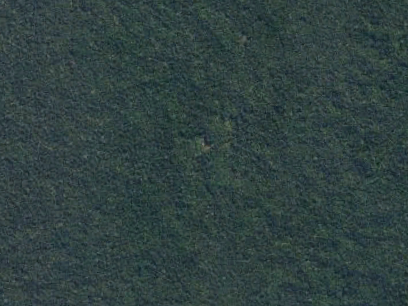
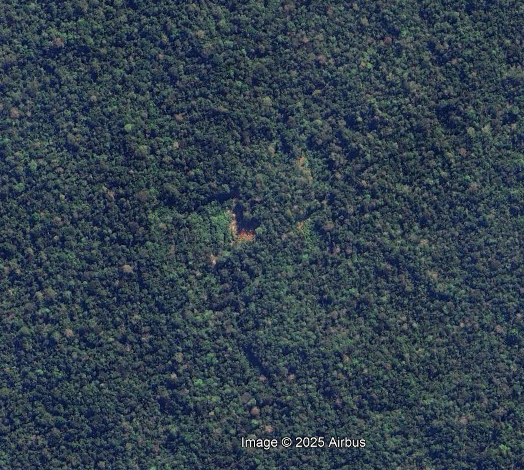
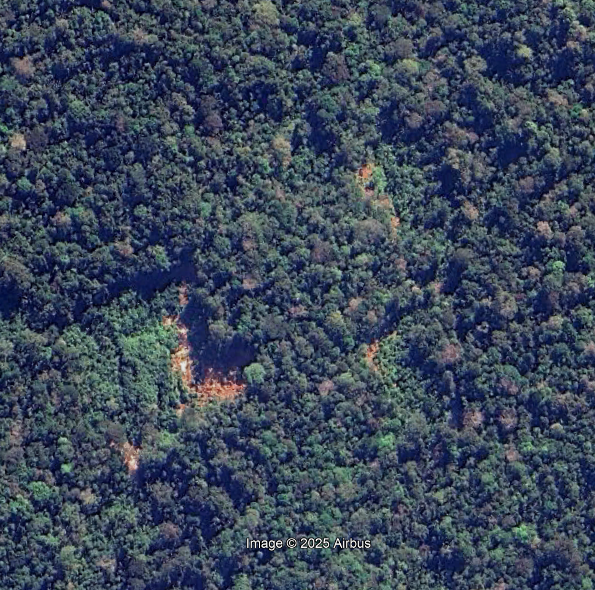
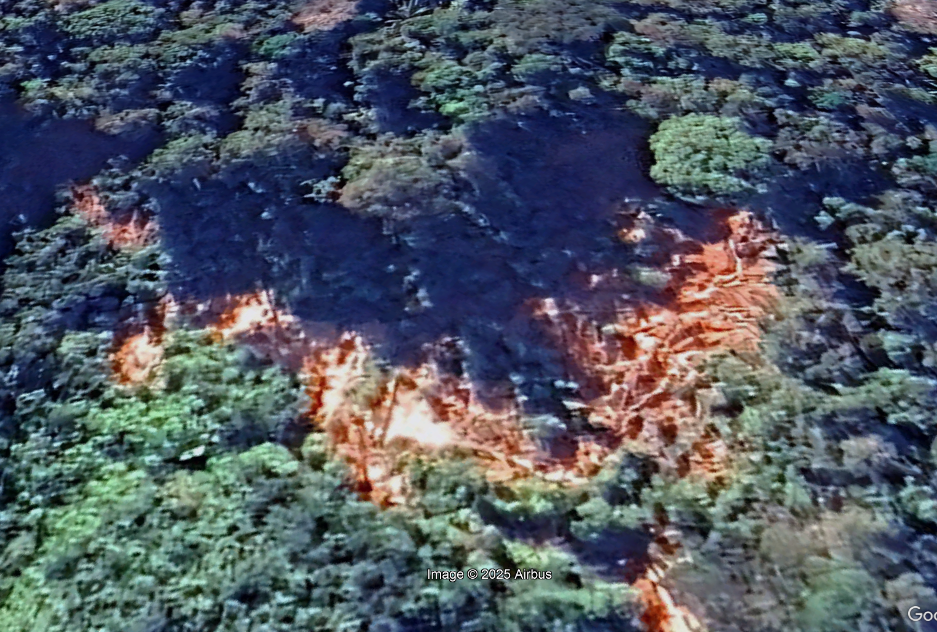
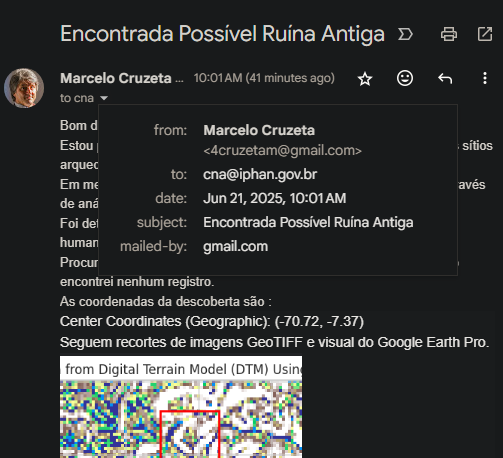

In [30]:
# Define the path to the directory with files
directory = '/kaggle/input/images-of-tiles-1-to-17-with-analysis/discoveries'

# Define a dictionary for image filenames and their descriptions
descriptions = {
    "disc.png": "The image of our square in the the right place.</br> Try using these coordinates in your GEP and tell me if what you see in the images when you zoom in on the location isn't surprising. (-70.72, -7.37)",
    "disc_6png.png": "The image of the place as we see in GEP.</br> The objective here is just to compare the definition of the image extracted from GEP with what we currently have from GEE, the quality is incomparable.",
    "disc_7png.png": "The image of the place as we see in GEP, more zoom.</br> The objective here is just to compare the definition of the image extracted from GEP with what we currently have from GEE, the quality is incomparable.",
    "disc_8png.png": "The image of the place as we see in GEP, more zoom.</br> The objective here is just to compare the definition of the image extracted from GEP with what we currently have from GEE, the quality is incomparable.",
    "disc_3.png": "This 3D image from GEP is very intriguing.</br> It looks like there was a landslide, perhaps due to a lot of rain, which is showing what appears to be a stone slab or something like that. What do you think? Or has someone already been there digging to find the lost treasures in the middle of the jungle?",
    "disc_5.png": "I have seen incredible things while flying over these forests. However, for obvious reasons, I could not stop and take a look.</br>On this route, Cruzeiro do Sul - Tarauacá, it is a flight of more than an hour in a small plane flying over the forest, there is nothing but forest to see.</br>I found these images so unusual that I even sent an email to IPHAN notifying them of the discovery.</br>The first thing we do when we find an archaeological site is to notify the responsible government agency.",
    
    # Add more images and descriptions as needed
}

# Create a DataFrame for easier visualization
data = []
for file_name, description in descriptions.items():
    tile_png = os.path.join(directory, file_name)
    if os.path.exists(tile_png):  # Only add existing images
        data.append((tile_png, description))

df = pd.DataFrame(data, columns=['PNG', 'Description'])

# Function to convert image to base64
def pil_to_base64(img):
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    return f"data:image/png;base64,{img_str}"

# Collect HTML for all images and descriptions
html_content = ""

for index, row in df.iterrows():
    png_img = Image.open(row['PNG'])
    png_base64 = pil_to_base64(png_img)

    # Extract just the file names for display
    png_file_name = os.path.basename(row['PNG'])

    # Create HTML for each image and its description
    html_content += f"""
    <table style="min-width: 50px; margin-bottom: 20px;">
        <colgroup>
            <col style="min-width: 250px;">  <!-- Adjusted for image column size -->
            <col style="min-width: 250px;">  <!-- Keep the smaller description column -->
        </colgroup>
        <tbody>
            <tr>
                <td colspan="1" rowspan="1" style="text-align: left;">
                    <strong>Image: {png_file_name}</strong><br>
                    <img src="{png_base64}" width="250" height="auto">  <!-- Increased image width -->
                </td>
                <td colspan="1" rowspan="2" style="text-align: left; padding-left: 20px;">
                    <strong>Description</strong><br>
                    {row['Description']}
                </td>
            </tr>
        </tbody>
    </table>
    """

# Display all the collected HTML content
display(HTML(html_content))

# 28 What if !?! 🤔
Regarding this detailed image of this location (disc_3.png), which we obtained through GEP... what would GPT Vision say about it if we sent it to analyze it !?! 🤔</br>
Let's see...

In [31]:
# Send the image for analysis with our improved function analyze_single_png
# How to use it:
prompt = ("We show you a png image derived from LIDAR elevation data before, and you"
          "concluded it suggested possible archaeological or anthropogenic modification of the terrain."
          "Now we are bringing an aerial image with deail of the same location."
          "Can you describe this image in plain English based on the information I have given you?")
png_file = "/kaggle/input/images-of-tiles-1-to-17-with-analysis/discoveries/disc_3.png"

# Analyze the PNG file
result = analyze_single_png(prompt, png_file)

# Print results
print("\n--- Summary of Results ---")
print(f"Dataset ID: {result['Dataset ID']}")
print(f"Model Version: {result['Model Version']}\n")
print("Generated Output Text:")
print("-------------------------")
print(result['Generated Output Text'])


--- Summary of Results ---
Dataset ID: marcelocruzeta/z-challenge-files
Model Version: gpt-4.1-2025-04-14

Generated Output Text:
-------------------------
Certainly! Based on the information you provided about this being the same location as your previous LIDAR elevation image that suggested possible archaeological or anthropogenic modifications, here is a plain English description of the current aerial image:

This aerial image shows a forested area with dense tree cover. Amidst the vegetation, there are several exposed patches of reddish or light brown earth that cut irregular, linear, or geometric shapes through the greenery. These cleared or eroded sections stand out distinctly from the surrounding darker, vegetated areas. The exposed earth may indicate recent disturbances or natural erosion, but given your prior note about possible human modification from LIDAR data, these features could also mark the surface traces of man-made structures or landscape modifications, such as eart

# 29. Location may have anthropogenic modification !!! 😳
